## Immuno_Protein_design ##

In [1]:
## This codes used for design a whole novel protein according Immuno Effect
## and other features aslike homologous transmembrane

In [77]:
allele_freq = "/home/jovyan/work/05.pipeline_dev/Antigen_Design/Immu_Epitope_analysis_test/config/HLA_frequency.xlsx"
epitope_mhci_file = "/home/jovyan/work/02.ResDev/12.TAA_epitope_human/05.AML_TAA_Epitope/02.protein_antigen_prediction_new/parsed_res_MHCI/merge.netMHCI.csv"
epitope_mhcii_file = "/home/jovyan/work/02.ResDev/12.TAA_epitope_human/05.AML_TAA_Epitope/02.protein_antigen_prediction_new/parsed_res_MHCII/merge.netMHCII.csv"
fasta_file = "/home/jovyan/work/02.ResDev/12.TAA_epitope_human/05.AML_TAA_Epitope/01.protein_sequence/protein.merge.aa.fasta"
homo_file = "/home/jovyan/work/02.ResDev/12.TAA_epitope_human/05.AML_TAA_Epitope/03.homologous/homo_peptide.bed"
outpath = "/home/jovyan/work/02.ResDev/12.TAA_epitope_human/05.AML_TAA_Epitope/06.Deliverables"

### Step1: Calculate the Immuno_Effect ###

In [75]:
import pandas as pd
import os

In [4]:
epitope_mhci_df = pd.read_csv(epitope_mhci_file,header=0) 
epitope_mhcii_df = pd.read_csv(epitope_mhcii_file,header=0)

In [5]:
epitope_mhcii_df.head()

,Pos,MHC,Peptide,Of,Core,Core_Rel,Identity,Score_EL,%Rank_EL,Exp_Bind,Score_BA,Affinity(nM),%Rank_BA,BindLevel
0,151,DRB1_1106,EDRIIYQAHKRLGNR,4,IYQAHKRLG,0.887,sp|P10242|MYB_H,0.970694,0.03,NaN,0.641278,48.49,0.16,SB
1,152,DRB1_1106,DRIIYQAHKRLGNRW,3,IYQAHKRLG,0.960,sp|P10242|MYB_H,0.966064,0.05,NaN,0.652283,43.04,0.11,SB
2,150,DRB1_1106,EEDRIIYQAHKRLGN,5,IYQAHKRLG,0.880,sp|P10242|MYB_H,0.943460,0.14,NaN,0.616315,63.52,0.33,SB
3,153,DRB1_1106,RIIYQAHKRLGNRWA,2,IYQAHKRLG,0.967,sp|P10242|MYB_H,0.912701,0.30,NaN,0.667196,36.63,0.06,SB
4,100,DRB1_1106,DQRVIELVQKYGPKR,4,IELVQKYGP,0.780,sp|P10242|MYB_H,0.906237,0.33,NaN,0.552865,126.20,1.34,SB


In [6]:
allele_hlaA_df = pd.read_excel(allele_freq,sheet_name="HLA-A")
allele_hlaB_df = pd.read_excel(allele_freq,sheet_name="HLA-B")
allele_hlaC_df = pd.read_excel(allele_freq,sheet_name="HLA-C")
allele_DRB1_df = pd.read_excel(allele_freq,sheet_name="HLA-DRB1")
allele_DPB1_df = pd.read_excel(allele_freq,sheet_name="HLA-DPB1")
allele_DQB1_df = pd.read_excel(allele_freq,sheet_name="HLA-DQB1")
#MHCI_hla = pd.concat([allele_hlaA_df,allele_hlaB_df,allele_hlaC_df])
#MHCII_hla = pd.concat([allele_DRB1_df,allele_DPB1_df,allele_DQB1_df])
allele_hlaA_df.allele = "HLA-" + allele_hlaA_df.allele
allele_hlaB_df.allele = "HLA-" + allele_hlaB_df.allele
allele_hlaC_df.allele = "HLA-" + allele_hlaC_df.allele
allele_mhci_dict = {"hlaA":allele_hlaA_df,"hlaB":allele_hlaB_df,"hlaC":allele_hlaC_df}
allele_mhcii_dict = {"hlaDRB1":allele_DRB1_df,"hlaDPB1":allele_DPB1_df,"hlaDQB1":allele_DQB1_df}

In [7]:
MHCI_allele_dict = pd.concat([allele_hlaA_df,allele_hlaB_df,allele_hlaC_df])
MHCII_allele_dict = pd.concat([allele_DRB1_df,allele_DPB1_df,allele_DQB1_df])
all_allele_dict = pd.concat([allele_hlaA_df,allele_hlaB_df,allele_hlaC_df,allele_DRB1_df,allele_DPB1_df,allele_DQB1_df])

In [8]:
allele_DRB1_df.head()

,allele,counts,loci_num,frequency,allele_netmhc
0,DRB1*09:01,15224.0574,49566,0.1536,DRB1_0901
1,DRB1*15:01,11133.7716,49566,0.1123,DRB1_1501
2,DRB1*12:02,9723.6174,49566,0.0981,DRB1_1202
3,DRB1*07:01,7361.2470,49566,0.0743,DRB1_0701
4,DRB1*08:03,6523.2832,49566,0.0658,DRB1_0803


In [9]:
'''
Immuno_eff_dict = {}
with open(fasta_file,"r") as faf:
    for line in faf.readlines():
        if line.startswith(">sp"):
            print(line)
            unipID = line.split("|")[1]
        else:
            protSeq = line.strip()
            Immuno_eff_dict[unipID] = [0 for i in range(len(protSeq))]
            
            epitope_this_df = epitope_df[epitope_df["Identity"].str.contains(unipID)]
            #epitope_this_df = epitope_this_df.sort_values(by=['Pos'])
            epitope_this_df = epitope_this_df[(epitope_this_df["BindLevel"]=="WB") | (epitope_this_df["BindLevel"]=="SB")]
            epitope_this_wtfreq_df = pd.merge(epitope_this_df, MHCI_hla, left_on="MHC",right_on="allele")
            epitope_this_wtfreq_df["Immuno_score"] = -(2**(epitope_this_wtfreq_df["%Rank_EL"]/2))+2
            epitope_this_wtfreq_df["Immuno_eff"] = epitope_this_wtfreq_df["Immuno_score"]* epitope_this_wtfreq_df["frequency"]
            epitope_this_wtfreq_df = epitope_this_wtfreq_df.sort_values(by=['Pos'])
            #Peptide = epitope_this_df.loc[426780,"Peptide"]
            #Rank_EL = epitope_this_df.loc[426780,"Peptide"]
            indexlist = epitope_this_wtfreq_df.index.to_list()
            for index in indexlist:
                Peptide =  epitope_this_wtfreq_df.loc[index,"Peptide"]
                Immuno_eff = float(epitope_this_wtfreq_df.loc[index,"Immuno_eff"])
                Pos = int(epitope_this_wtfreq_df.loc[index,"Pos"])
                #print(protSeq[Pos-1:Pos+len(Peptide)-1])
                for ipos in range(Pos-1, Pos+len(Peptide)-1):
                    Immuno_eff_dict[unipID][ipos] += Immuno_eff
            
            #print(epitope_this_wtfreq_df.head(50))
            #input("Press Enter to continue...")
'''
print("")

In [10]:
###  HLA_A/B/C
Immuno_eff_all_allele_dict = {}
with open(fasta_file,"r") as faf:
    for line in faf.readlines():
        if line.startswith(">sp"):
            print(line)
            unipID = line.split("|")[1]
            genename = line.split("|")[2].split("_")[0]
            TAAid = "_".join([genename,unipID])
        else:
            protSeq = line.strip()
            Immuno_eff_all_allele_dict[TAAid] = {}
            
            epitope_this_df = epitope_mhci_df[epitope_mhci_df["Identity"].str.contains(unipID)]
            #epitope_this_df = epitope_this_df.sort_values(by=['Pos'])
            epitope_this_df = epitope_this_df[(epitope_this_df["BindLevel"]=="WB") | (epitope_this_df["BindLevel"]=="SB")]
            
            for allele in allele_mhci_dict:
                print(allele)
                Immuno_eff_all_allele_dict[TAAid][allele] = [0 for i in range(len(protSeq))]
                allele_freq_file = allele_mhci_dict[allele]
                epitope_this_wtfreq_df = pd.merge(epitope_this_df, allele_freq_file, left_on="MHC",right_on="allele")
                epitope_this_wtfreq_df["Immuno_score"] = -(2**(epitope_this_wtfreq_df["%Rank_EL"]/2))+2
                epitope_this_wtfreq_df["Immuno_eff"] = epitope_this_wtfreq_df["Immuno_score"]* epitope_this_wtfreq_df["frequency"]
                #Peptide = epitope_this_df.loc[426780,"Peptide"]
                #Rank_EL = epitope_this_df.loc[426780,"Peptide"]
                hla_type_list = list(epitope_this_wtfreq_df.MHC.unique())
                for iHLA in hla_type_list:
                    #print(iHLA)
                    immuno_eff_list = [[0] for i in range(len(protSeq))]
                    epitope_this_wtfreq_hla_df = epitope_this_wtfreq_df[epitope_this_wtfreq_df["MHC"]==iHLA]
                    epitope_this_wtfreq_hla_df = epitope_this_wtfreq_hla_df.sort_values(by=['Pos'])
                    indexlist = epitope_this_wtfreq_hla_df.index.to_list()
                    for index in indexlist:
                        Peptide =  epitope_this_wtfreq_hla_df.loc[index,"Peptide"]
                        Immuno_eff = float(epitope_this_wtfreq_hla_df.loc[index,"Immuno_eff"])
                        Pos = int(epitope_this_wtfreq_hla_df.loc[index,"Pos"])
                        #print(protSeq[Pos-1:Pos+len(Peptide)-1])
                        for ipos in range(Pos-1, Pos+len(Peptide)-1):
                            immuno_eff_list[ipos].append(Immuno_eff)
                    #print(immuno_eff_list)
                    for ipos in range(len(protSeq)):
                        immuno_eff_max = max(immuno_eff_list[ipos])
                        Immuno_eff_all_allele_dict[TAAid][allele][ipos] += immuno_eff_max
                    #print(Immuno_eff_dict[TAAid])
                    #input("Press Enter to continue...")
            #print(epitope_this_wtfreq_df.head(50))
            

>sp|P30939|5HT1F_HUMAN 5-hydroxytryptamine receptor 1F OS=Homo sapiens OX=9606 GN=HTR1F PE=1 SV=1

hlaA
hlaB
hlaC
>sp|Q00534|CDK6_HUMAN Cyclin-dependent kinase 6 OS=Homo sapiens OX=9606 GN=CDK6 PE=1 SV=1

hlaA
hlaB
hlaC
>sp|Q5HYN5|CT451_HUMAN Cancer/testis antigen family 45 member A1 OS=Homo sapiens OX=9606 GN=CT45A1 PE=1 SV=1

hlaA
hlaB
hlaC
>sp|Q8IYM0|F186B_HUMAN Protein FAM186B OS=Homo sapiens OX=9606 GN=FAM186B PE=2 SV=2

hlaA
hlaB
hlaC
>sp|O75388|GPR32_HUMAN Probable G-protein coupled receptor 32 OS=Homo sapiens OX=9606 GN=GPR32 PE=2 SV=1

hlaA
hlaB
hlaC
>sp|P15814|IGLL1_HUMAN Immunoglobulin lambda-like polypeptide 1 OS=Homo sapiens OX=9606 GN=IGLL1 PE=1 SV=1

hlaA
hlaB
hlaC
>sp|P10242|MYB_HUMAN Transcriptional activator Myb OS=Homo sapiens OX=9606 GN=MYB PE=1 SV=2

hlaA
hlaB
hlaC
>sp|Q01851|PO4F1_HUMAN POU domain, class 4, transcription factor 1 OS=Homo sapiens OX=9606 GN=POU4F1 PE=1 SV=4

hlaA
hlaB
hlaC
>sp|Q96A99|PTX4_HUMAN Pentraxin-4 OS=Homo sapiens OX=9606 GN=PTX4 PE=2 SV=2


In [11]:
###  HLA_DRB1/
with open(fasta_file,"r") as faf:
    for line in faf.readlines():
        if line.startswith(">sp"):
            print(line)
            unipID = line.split("|")[1]
            genename = line.split("|")[2].split("_")[0]
            TAAid = "_".join([genename,unipID])
        else:
            protSeq = line.strip()
            
            epitope_this_df = epitope_mhcii_df[epitope_mhcii_df["Identity"].str.contains(unipID)]
            #epitope_this_df = epitope_this_df.sort_values(by=['Pos'])
            epitope_this_df = epitope_this_df[(epitope_this_df["BindLevel"]=="WB") | (epitope_this_df["BindLevel"]=="SB")]
            
            for allele in allele_mhcii_dict:
                #print(allele)
                Immuno_eff_all_allele_dict[TAAid][allele] = [0 for i in range(len(protSeq))]
                allele_freq_file = allele_mhcii_dict[allele]
                epitope_this_wtfreq_df = pd.merge(epitope_this_df, allele_freq_file, left_on="MHC",right_on="allele_netmhc")
                epitope_this_wtfreq_df["Immuno_score"] = -(2**(epitope_this_wtfreq_df["%Rank_EL"]/10))+2
                epitope_this_wtfreq_df["Immuno_eff"] = epitope_this_wtfreq_df["Immuno_score"]* epitope_this_wtfreq_df["frequency"]
                #Peptide = epitope_this_df.loc[426780,"Peptide"]
                #Rank_EL = epitope_this_df.loc[426780,"Peptide"]
                hla_type_list = list(epitope_this_wtfreq_df.MHC.unique())
                for iHLA in hla_type_list:
                    #print(iHLA)
                    immuno_eff_list = [[0] for i in range(len(protSeq))]
                    epitope_this_wtfreq_hla_df = epitope_this_wtfreq_df[epitope_this_wtfreq_df["MHC"]==iHLA]
                    epitope_this_wtfreq_hla_df = epitope_this_wtfreq_hla_df.sort_values(by=['Pos'])
                    indexlist = epitope_this_wtfreq_hla_df.index.to_list()
                    for index in indexlist:
                        Peptide =  epitope_this_wtfreq_hla_df.loc[index,"Peptide"]
                        Immuno_eff = float(epitope_this_wtfreq_hla_df.loc[index,"Immuno_eff"])
                        Pos = int(epitope_this_wtfreq_hla_df.loc[index,"Pos"])
                        #print(protSeq[Pos-1:Pos+len(Peptide)-1])
                        for ipos in range(Pos-1, Pos+len(Peptide)-1):
                            immuno_eff_list[ipos].append(Immuno_eff)
                    #print(immuno_eff_list)
                    for ipos in range(len(protSeq)):
                        immuno_eff_max = max(immuno_eff_list[ipos])
                        Immuno_eff_all_allele_dict[TAAid][allele][ipos] += immuno_eff_max
                    #print(Immuno_eff_all_allele_dict[TAAid][allele])
                    #input("Press Enter to continue...")


>sp|P30939|5HT1F_HUMAN 5-hydroxytryptamine receptor 1F OS=Homo sapiens OX=9606 GN=HTR1F PE=1 SV=1

>sp|Q00534|CDK6_HUMAN Cyclin-dependent kinase 6 OS=Homo sapiens OX=9606 GN=CDK6 PE=1 SV=1

>sp|Q5HYN5|CT451_HUMAN Cancer/testis antigen family 45 member A1 OS=Homo sapiens OX=9606 GN=CT45A1 PE=1 SV=1

>sp|Q8IYM0|F186B_HUMAN Protein FAM186B OS=Homo sapiens OX=9606 GN=FAM186B PE=2 SV=2

>sp|O75388|GPR32_HUMAN Probable G-protein coupled receptor 32 OS=Homo sapiens OX=9606 GN=GPR32 PE=2 SV=1

>sp|P15814|IGLL1_HUMAN Immunoglobulin lambda-like polypeptide 1 OS=Homo sapiens OX=9606 GN=IGLL1 PE=1 SV=1

>sp|P10242|MYB_HUMAN Transcriptional activator Myb OS=Homo sapiens OX=9606 GN=MYB PE=1 SV=2

>sp|Q01851|PO4F1_HUMAN POU domain, class 4, transcription factor 1 OS=Homo sapiens OX=9606 GN=POU4F1 PE=1 SV=4

>sp|Q96A99|PTX4_HUMAN Pentraxin-4 OS=Homo sapiens OX=9606 GN=PTX4 PE=2 SV=2

>sp|Q6ZV50|RFX8_HUMAN DNA-binding protein RFX8 OS=Homo sapiens OX=9606 GN=RFX8 PE=2 SV=2

>sp|P04053|TDT_HUMAN DNA nucl

In [12]:
for TAAid in Immuno_eff_all_allele_dict.keys():
    print(TAAid)
    for allele in Immuno_eff_all_allele_dict[TAAid]:
        length = len(Immuno_eff_all_allele_dict[TAAid][allele])
    Immuno_eff_all_allele_dict[TAAid]["allele_merge"] = [0 for i in range(length)]
    for allele in Immuno_eff_all_allele_dict[TAAid]:
        if allele != "allele_merge":
            #print(allele)
            for ipos,imm_eff in enumerate(Immuno_eff_all_allele_dict[TAAid][allele]):
                #print(ipos,imm_eff)
                Immuno_eff_all_allele_dict[TAAid]["allele_merge"][ipos] += imm_eff


5HT1F_P30939
CDK6_Q00534
CT451_Q5HYN5
F186B_Q8IYM0
GPR32_O75388
IGLL1_P15814
MYB_P10242
PO4F1_Q01851
PTX4_Q96A99
RFX8_Q6ZV50
TDT_P04053
TPOR_P40238
WT1_P19544


In [13]:
#Immuno_eff_all_allele_dict["5HT1F_P30939"]["hlaA"]

## Draw plot

In [14]:
import matplotlib.pyplot as plt

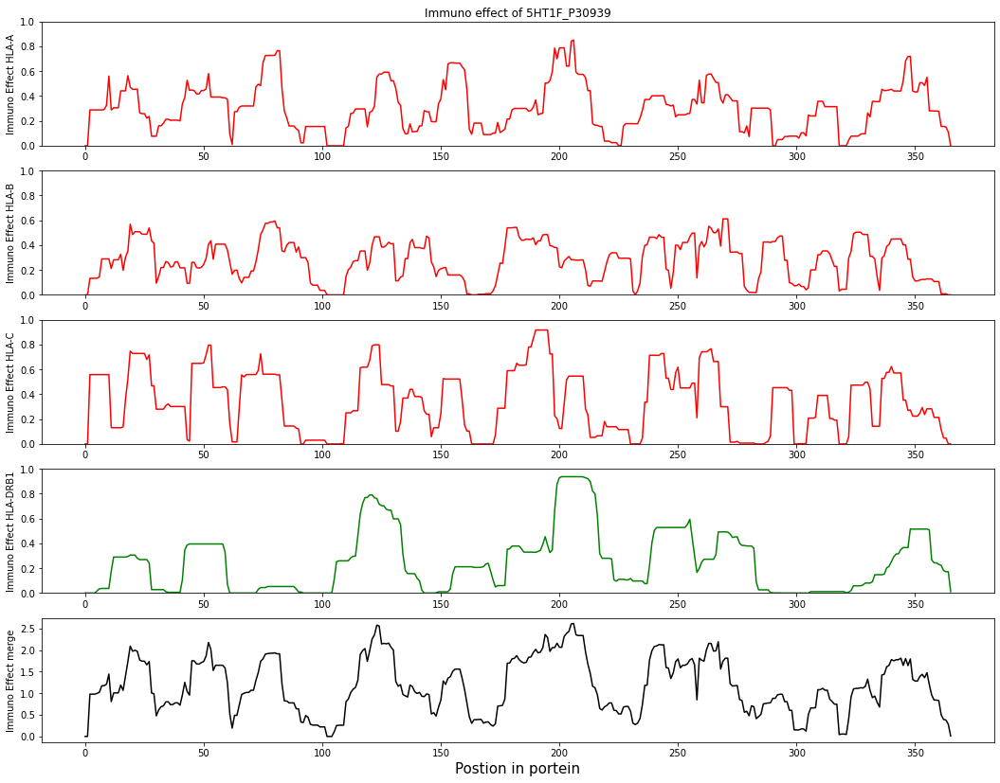

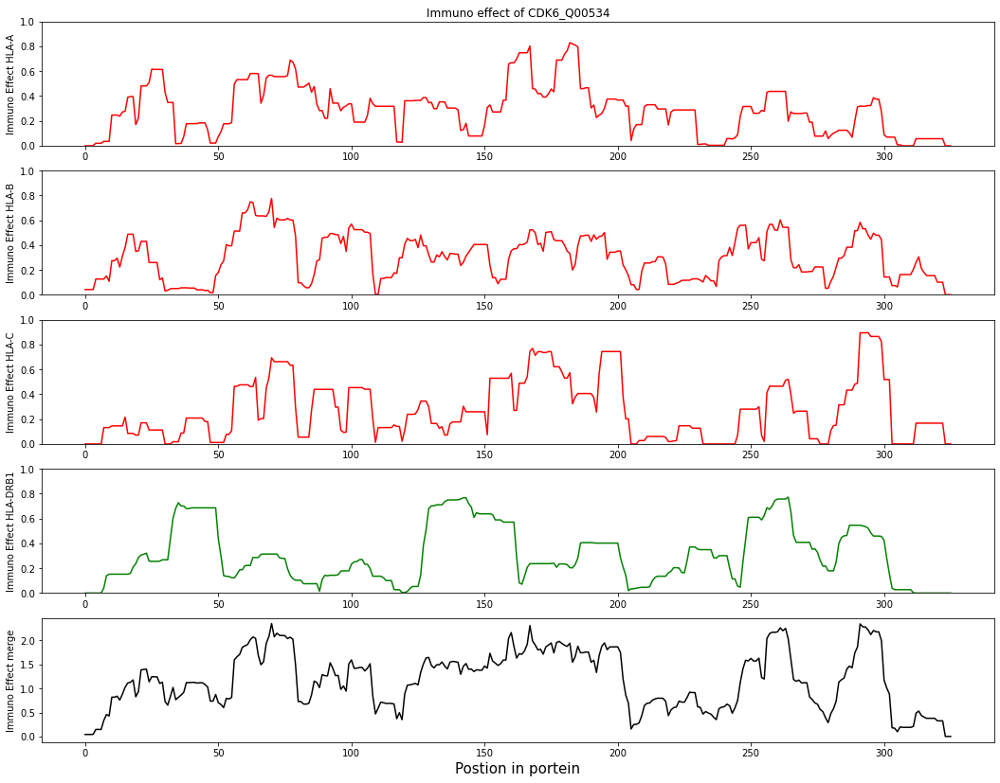

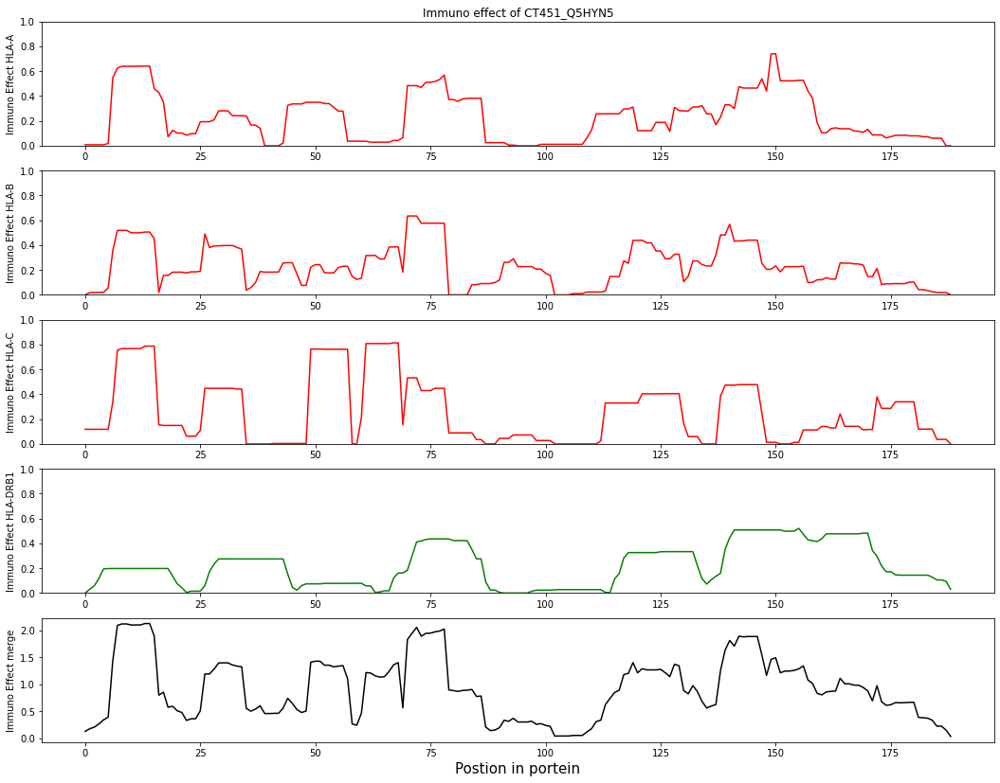

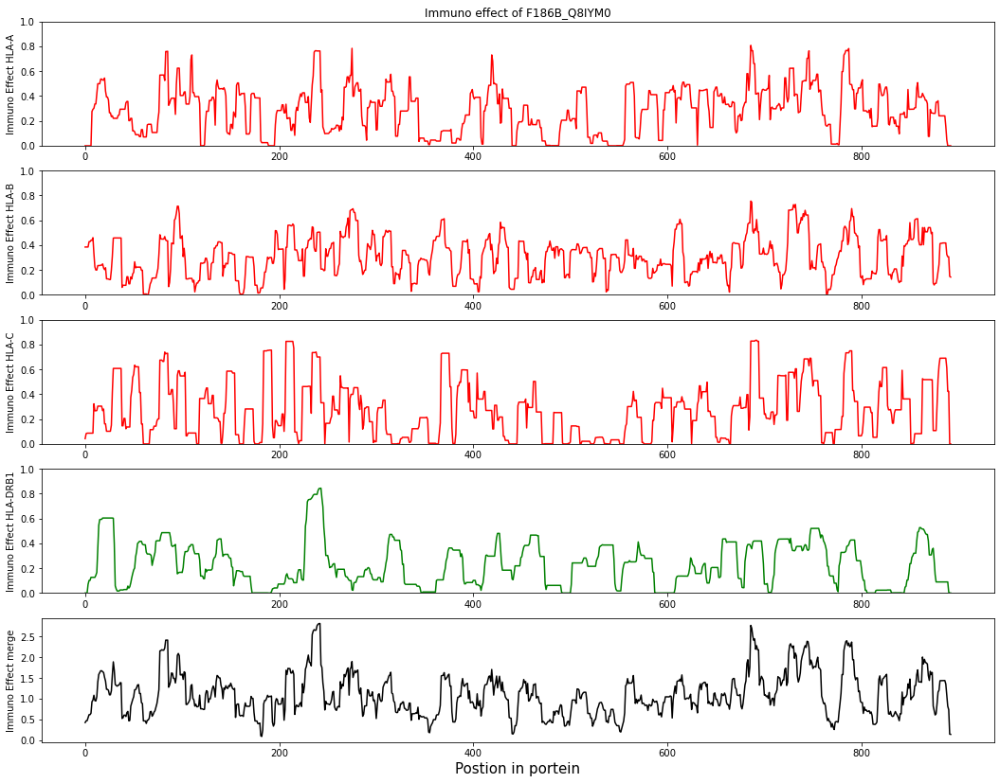

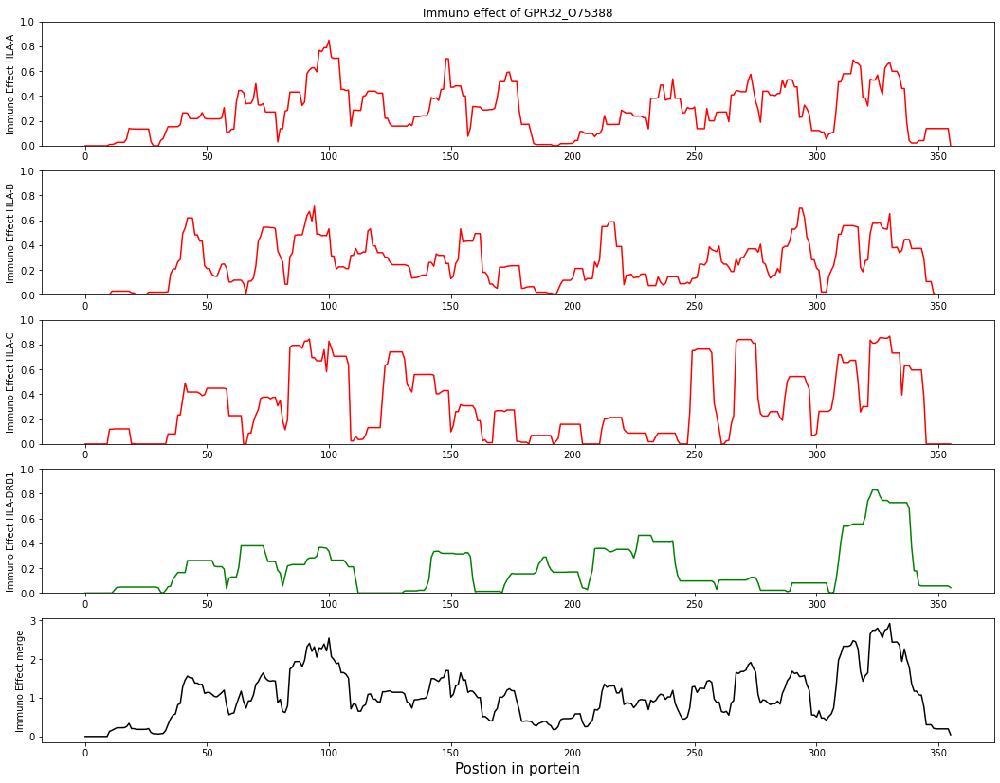

...

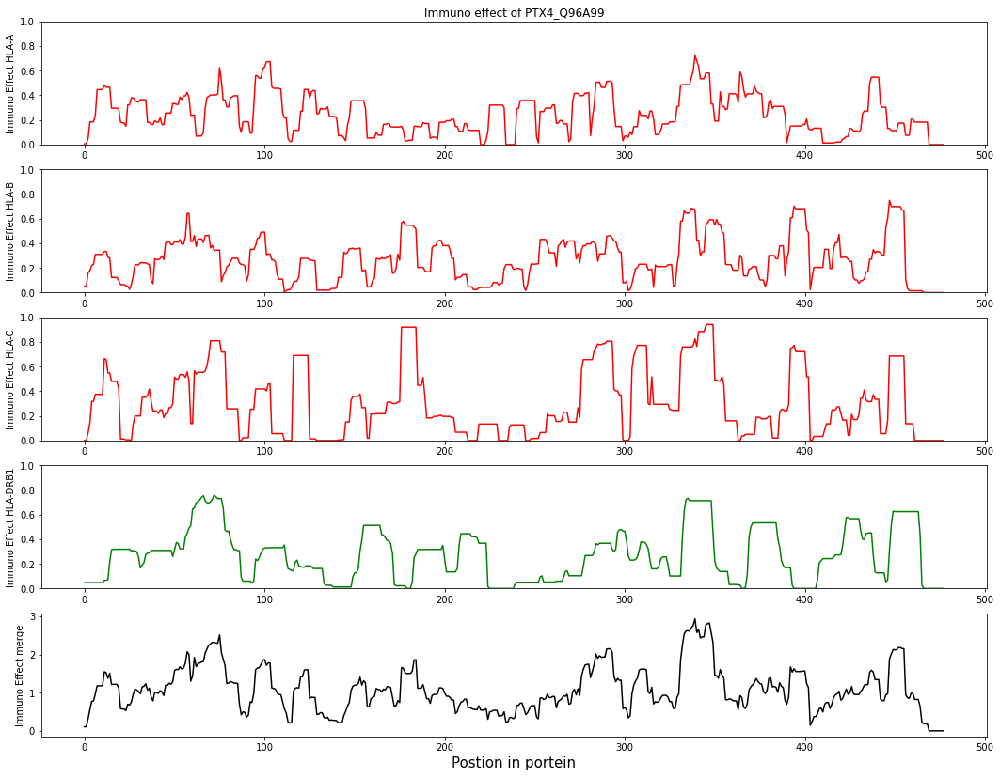

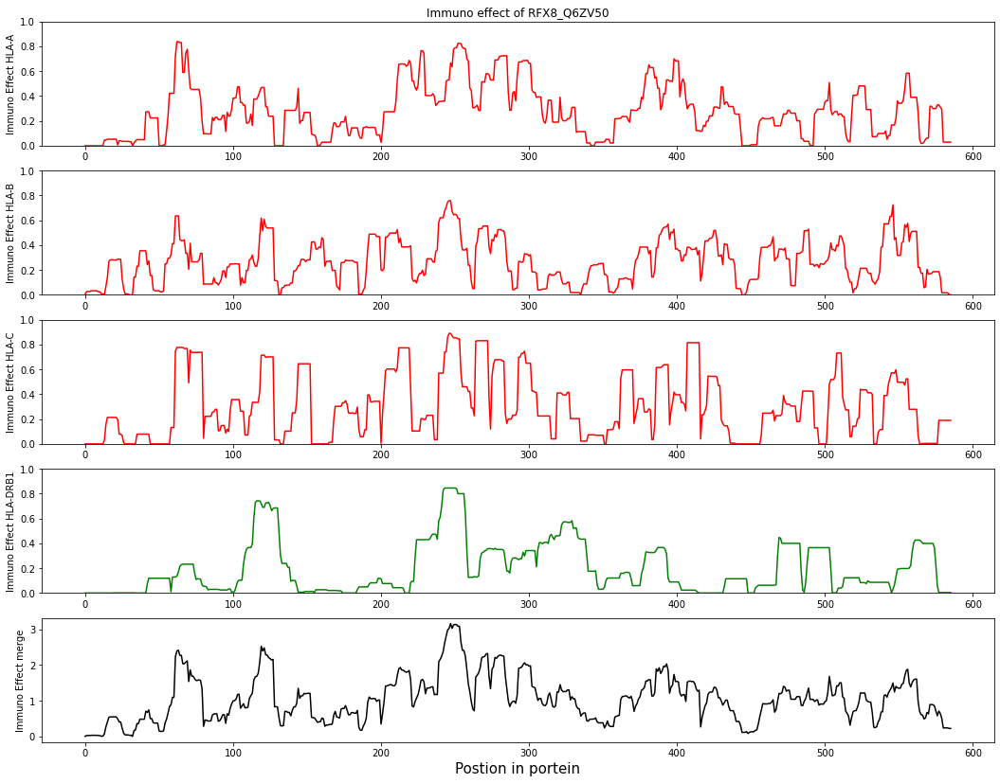

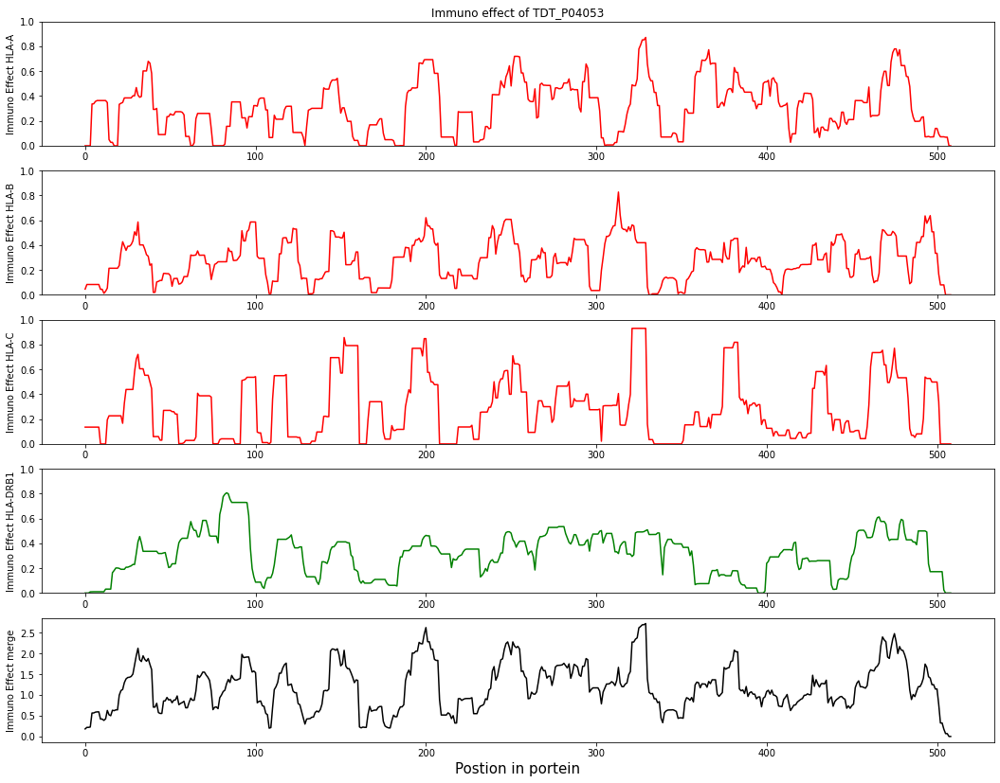

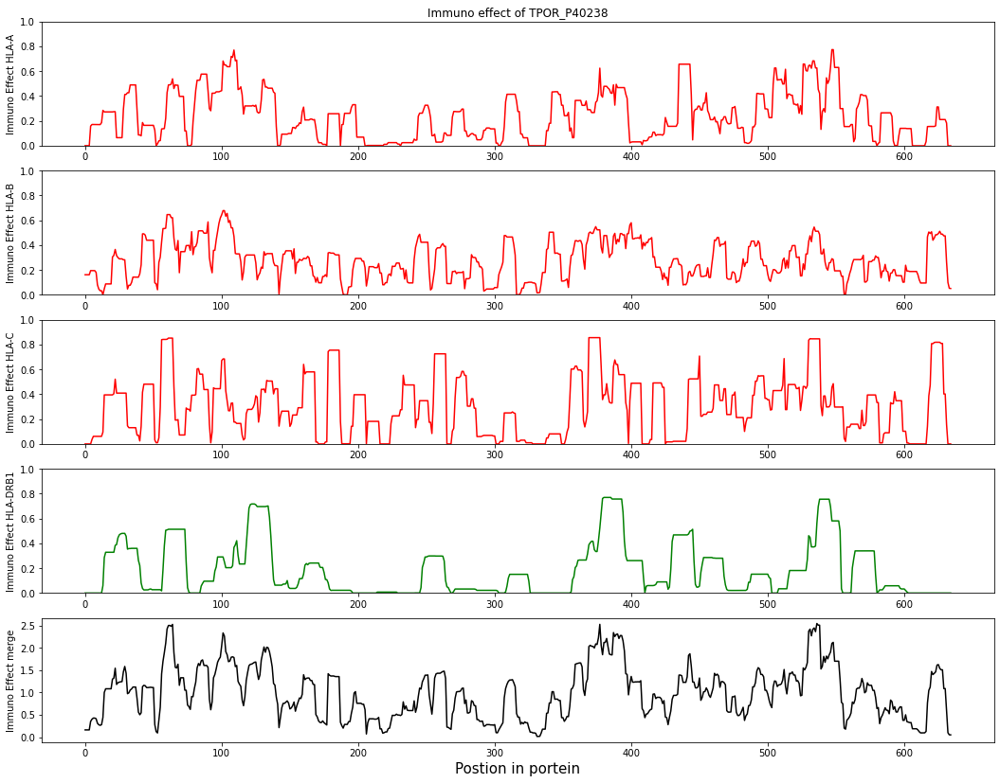

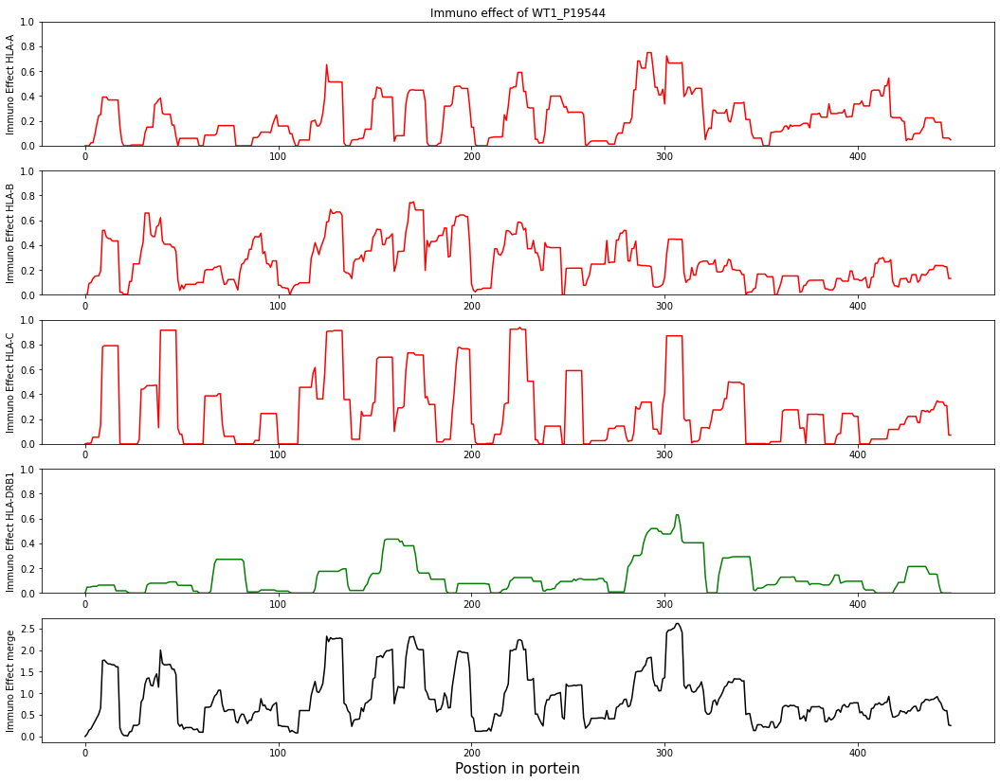

In [15]:
for TAA in Immuno_eff_all_allele_dict:
    fig,(ax_hlaA,ax_hlaB,ax_hlaC,ax_hlaDRB1,ax_merge) = plt.subplots(5,1,figsize=(18,14))
    
    for allele in Immuno_eff_all_allele_dict[TAA]:
        x = list(range(len(Immuno_eff_all_allele_dict[TAA][allele])))
        y = Immuno_eff_all_allele_dict[TAA][allele]
        if allele=="hlaA":
            ax_hlaA.plot(x,y,color="red")
            ax_hlaA.set_ylim(0,1)
            ax_hlaA.title.set_text("Immuno effect of {}".format(TAA))
            ax_hlaA.set_ylabel("Immuno Effect HLA-A",size=10)
        elif allele=="hlaB":
            ax_hlaB.plot(x,y,color="red")
            ax_hlaB.set_ylim(0,1)
            ax_hlaB.set_ylabel("Immuno Effect HLA-B",size=10)
        elif allele=="hlaC":
            ax_hlaC.plot(x,y,color="red")
            ax_hlaC.set_ylim(0,1)
            ax_hlaC.set_ylabel("Immuno Effect HLA-C",size=10)
        elif allele=="hlaDRB1":
            ax_hlaDRB1.plot(x,y,color="green")
            ax_hlaDRB1.set_ylim(0,1)
            ax_hlaDRB1.set_ylabel("Immuno Effect HLA-DRB1",size=10)
        elif allele=="allele_merge":
            ax_merge.plot(x,y,color="black")
            #ax_merge.set_ylim(0.0,5.0)
            ax_merge.set_xlabel("Postion in portein",size=15)
            ax_merge.set_ylabel("Immuno Effect merge",size=10)
    plt.show()
    #input("please enter your input")

## Step2: Select sequence  ##

In [16]:
import copy
import numpy as np

In [17]:
## Tools of functions which can generate return results of certain region with tuple format
def get_region(element_list,cutoff1,cutoff2,epitope_min_len):
    #cutoff1 = 1.2
    #cutoff2 = 0
    element_list_trans = []
    for i,v in enumerate(element_list):
        if v >= cutoff1:
            element_list_trans.append("H")
        elif v >= cutoff2:
            element_list_trans.append("M")
        else:
            element_list_trans.append("L")
    #print(element_list_trans)

    Immu_eff_list_region = []
    skip_flag = "N"
    skip_steps = 0
    for i,v in enumerate(element_list_trans):
        #print(i,end=" ")
        if skip_flag == "N":
            if v == "H":
                for j,v2 in  enumerate(element_list_trans[i:]):
                    #print(j,v2)
                    if v2 != "H":
                        break
                if j >= epitope_min_len:
                    Immu_eff_list_region.append((i,i+j))
                    #print(element_list_trans[i:i+j])
                    skip_flag = "Y"
                    skip_steps = j-1
        elif skip_flag == "Y":
            if skip_steps != 0:
                skip_steps -= 1
            else:
                skip_flag = "N"
                    
    return(Immu_eff_list_region)

In [18]:
## set values in reigons of homologouse as -0.5
Immuno_eff_all_allele_dict_withhomo = copy.deepcopy(Immuno_eff_all_allele_dict)
for TAA in Immuno_eff_all_allele_dict_withhomo.keys():
    print(TAA)
    #print(key)
    Immuno_eff_all_allele_dict_withhomo[TAA]["withhomo"] = copy.deepcopy(Immuno_eff_all_allele_dict_withhomo[TAA]["allele_merge"])
    Immuno_eff_all_allele_dict_withhomo[TAA]["homoregion"] = []
    Immuno_eff_all_allele_dict_withhomo[TAA]["seq"] = ""
#print(Immuno_eff_all_allele_dict_withhomo)
with open(homo_file,"r") as homof:
    for line in homof.readlines():
        if line.startswith("sp|"):
            unipid = line.split("|")[1]
            genename = line.split("|")[2].split("_")[0]
            TAA = "_".join([genename,unipid])
            iposs = int(line.split('\t')[1])
            ipose = int(line.split('\t')[2])
            #print(TAAid,iposs-1,ipose)
            Immuno_eff_all_allele_dict_withhomo[TAA]["homoregion"].append((iposs-1,ipose))
            for ipos in range(iposs-1,ipose):
                Immuno_eff_all_allele_dict_withhomo[TAA]["withhomo"][ipos] = -0.5
                
with open(fasta_file,"r") as faf:
    for line in faf.readlines():
        if line.startswith(">sp"):
            #print(line)
            unipID = line.split("|")[1]
            genename = line.split("|")[2].split("_")[0]
            TAA = "_".join([genename,unipID])
        else:
            protSeq = line.strip()
            Immuno_eff_all_allele_dict_withhomo[TAA]["seq"] = protSeq

5HT1F_P30939
CDK6_Q00534
CT451_Q5HYN5
F186B_Q8IYM0
GPR32_O75388
IGLL1_P15814
MYB_P10242
PO4F1_Q01851
PTX4_Q96A99
RFX8_Q6ZV50
TDT_P04053
TPOR_P40238
WT1_P19544


In [19]:
Immuno_eff_all_allele_dict_withhomo["5HT1F_P30939"].keys()

dict_keys(['hlaA', 'hlaB', 'hlaC', 'hlaDRB1', 'hlaDPB1', 'hlaDQB1', 'allele_merge', 'withhomo', 'homoregion', 'seq'])

In [20]:
'''
epitope_seq = ""
temp_high_seq = ""
temp_low_seq = ""
for TAA in Immuno_eff_all_allele_dict_withhomo.keys():
    TAA_seq = TAA_seq_dict[TAA]
    Immu_eff_list = Immuno_eff_all_allele_dict_withhomo[TAA]["withhomo"]
    print(TAA)
    print(TAA_seq_dict[TAA])
    print([float(format(i,".2f")) for i in Immu_eff_list])
    print(len(Immu_eff_list),len(TAA_seq))
    for i,v in zip(TAA_seq,Immu_eff_list):
        print(i,format(v,'.2f'), end = " ")
    converse_flag = "No"
    for ipos,immuno_eff in enumerate(Immu_eff_list[1:]):
        if immuno_eff >= immu_eff_merge_init:
            temp_high_seq += TAA_seq[ipos]
            if (immuno_eff - immu_eff_merge_init)*(Immu_eff_list[ipos-1] - immu_eff_merge_init) < 0:
                if len(temp_low_seq) >= len(linker):
                    epitope_seq += linker
                    print(epitope_seq)
                else:
                    epitope_seq += temp_low_seq
                    print(epitope_seq)
                temp_low_seq = ""
                
        elif immuno_eff >= 0:
            temp_low_seq += TAA_seq_dict[TAA][ipos]
            if (immuno_eff - immu_eff_merge_init)*(Immu_eff_list[ipos-1] - immu_eff_merge_init) < 0:
                if len(temp_high_seq) >= epitope_min_len:
                    epitope_seq += temp_high_seq
                    print(epitope_seq)
                else:
                    temp_low_seq = temp_high_seq + TAA_seq_dict[TAA][ipos]
                temp_high_seq = ""
                temp_low_seq = TAA_seq_dict[TAA][ipos]
                
        elif immuno_eff == -0.5:
            if (immuno_eff - immu_eff_merge_init)*(Immu_eff_list[ipos-1] - immu_eff_merge_init) < 0:
                if len(temp_high_seq) >= len(linker):
                    epitope_seq += temp_high_seq
                    print(epitope_seq)
                temp_high_seq = ""
            elif Immu_eff_list[ipos-1] < immu_eff_merge_init:
                temp_low_seq =  temp_low_seq
    print(epitope_seq)
    input("press your input")
print(epitope_seq) 
epitope_seq2 = epitope_seq.replace("XXXXXXXXXXXXXXXXXXXXXXXXXXXXXX","XXXXXXXXXXXXXXX")
print(len(epitope_seq))
print(len(epitope_seq2))
'''
print("")

In [122]:
max_load_length =600
linker="XXXXXXXXXXXXXXX"
epitope_min_len = 9
immu_eff_merge_init = 2.0
istep = 0.01
iterate = "Y"
while iterate == "Y":
    epitope_seq = ""
    immu_eff_merge_init += istep
    #print(immu_eff_merge_init)
    for TAA in Immuno_eff_all_allele_dict_withhomo.keys():
        #print(TAA)
        TAA_seq = Immuno_eff_all_allele_dict_withhomo[TAA]["seq"]
        Immu_eff_list = Immuno_eff_all_allele_dict_withhomo[TAA]["withhomo"]
        
        region_list = get_region(Immu_eff_list,immu_eff_merge_init,0,epitope_min_len)
        #print(region_list)

        Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"] = [0 for i in range(len(TAA_seq))]
        #print(Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"])
        immu_eff_merge_init_new = immu_eff_merge_init
        while len(region_list) == 0:
            immu_eff_merge_init_new -= abs(istep)
            region_list = get_region(Immu_eff_list,immu_eff_merge_init_new,0,epitope_min_len)
        #print(immu_eff_merge_init_new)
        Immuno_eff_all_allele_dict_withhomo[TAA]["selectregionnum"] = len(region_list)
        
        ########################################################################################
        
        last_pos2 = 0
        for (pos1,pos2) in region_list:
            #print((pos1,pos2))
            Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"][pos1:pos2] = [10 for i in range(pos1,pos2)]
            if len(epitope_seq) != 0:
                if pos1-last_pos2 >= len(linker):
                    epitope_seq += linker
                elif any(i<0 for i in Immu_eff_list[last_pos2:pos1]):
                    epitope_seq += linker
                else:
                    epitope_seq += TAA_seq[last_pos2:pos1]
                    Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"][last_pos2:pos1] = [100 for i in range(last_pos2,pos1)]
            epitope_seq += TAA_seq[pos1:pos2]
            last_pos2 = pos2
        '''
        for (pos1,pos2) in region_list:
            #print((pos1,pos2))
            epitope_seq += TAA_seq[pos1:pos2]
            Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"][pos1:pos2] = [10 for i in range(pos1,pos2)]
        epitope_seq += linker
        '''
         ########################################################################################
        Immuno_eff_all_allele_dict_withhomo[TAA]["cutoff"] = immu_eff_merge_init_new
        #input("press your input...")
    #print(len(epitope_seq))
    #print(epitope_seq)
    #epitope_seq = epitope_seq[:-len(linker)]
    if len(epitope_seq) > max_load_length*(1+0.05):
        iterate = "Y"
        istep = 0.01
    elif len(epitope_seq) < max_load_length*(1-0.05):
        iterate = "Y"
        istep = -0.01
    else:
        iterate = "N"
print("analysis complete")
print(epitope_seq)

analysis complete
FYIPLALILIXXXXXXXXXXXXXXXTFEHPNVVRLXXXXXXXXXXXXXXXKSAQPIEKFXXXXXXXXXXXXXXXSQIDDFTGFXXXXXXXXXXXXXXXILLEKIASFXXXXXXXXXXXXXXXVTMFPKLQLXXXXXXXXXXXXXXXLSLPIAMYYIVXXXXXXXXXXXXXXXSLNPFLYVFVGRDFQEKFFQSLTSALXXXXXXXXXXXXXXXKATPSVTLFXXXXXXXXXXXXXXXYAASSYLSLXXXXXXXXXXXXXXXAQAPPTAQLXXXXXXXXXXXXXXXMHPTLPEHKYXXXXXXXXXXXXXXXVSYNVDVRFRXXXXXXXXXXXXXXXLLPGSIHFVIGDPAFRELXXXXXXXXXXXXXXXATFGKLVRLXXXXXXXXXXXXXXXAIAFEKSTNYXXXXXXXXXXXXXXXRAASVLKSLPFTIXXXXXXXXXXXXXXXQSFKLFTSVFXXXXXXXXXXXXXXXFLPDAFVTMXXXXXXXXXXXXXXXHALYDKTKRXXXXXXXXXXXXXXXSLPDLHRVLXXXXXXXXXXXXXXXYSSDNLYQMXXXXXXXXXXXXXXXRVPGVAPTL


## Annotation of protein sequences by selecting designed

In [123]:
## check your selected designed protein sequence is correctly according region position:
check_seq_all = ""
for TAA in Immuno_eff_all_allele_dict_withhomo.keys():
    #print(TAA)
    #print(Immuno_eff_all_allele_dict_withhomo[TAA]["cutoff"])
    for i,v in enumerate(Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"]):
        if v != 0:
            check_seq_all +=Immuno_eff_all_allele_dict_withhomo[TAA]["seq"][i]
#print(epitope_seq)
print(epitope_seq.replace("X",""))
print(check_seq_all)
print(len(epitope_seq.replace("X","")))

FYIPLALILITFEHPNVVRLKSAQPIEKFSQIDDFTGFILLEKIASFVTMFPKLQLLSLPIAMYYIVSLNPFLYVFVGRDFQEKFFQSLTSALKATPSVTLFYAASSYLSLAQAPPTAQLMHPTLPEHKYVSYNVDVRFRLLPGSIHFVIGDPAFRELATFGKLVRLAIAFEKSTNYRAASVLKSLPFTIQSFKLFTSVFFLPDAFVTMHALYDKTKRSLPDLHRVLYSSDNLYQMRVPGVAPTL
FYIPLALILITFEHPNVVRLKSAQPIEKFSQIDDFTGFILLEKIASFVTMFPKLQLLSLPIAMYYIVSLNPFLYVFVGRDFQEKFFQSLTSALKATPSVTLFYAASSYLSLAQAPPTAQLMHPTLPEHKYVSYNVDVRFRLLPGSIHFVIGDPAFRELATFGKLVRLAIAFEKSTNYRAASVLKSLPFTIQSFKLFTSVFFLPDAFVTMHALYDKTKRSLPDLHRVLYSSDNLYQMRVPGVAPTL
245


In [125]:
## annotation of your designed protein sequence 
print("your designed protein sequence is:")
print(epitope_seq)
print("total length:")
print(len(epitope_seq))
print("total length without linker:")
print(len(epitope_seq.replace("X","")))
annot_dict = {}
for TAA in Immuno_eff_all_allele_dict_withhomo.keys():
    annot_dict[TAA] = {}
    annot_dict[TAA]["cutoff"]= Immuno_eff_all_allele_dict_withhomo[TAA]["cutoff"]
    annot_dict[TAA]["select_region_num"] = Immuno_eff_all_allele_dict_withhomo[TAA]["selectregionnum"]
    epitope_len = 0
    linker_len = 0
    for i in Immuno_eff_all_allele_dict_withhomo[TAA]["selectregion"]:
        if i == 10:
            epitope_len += i
        elif i == 100:
            linker_len += i
    annot_dict[TAA]["select_region_len"] = int(epitope_len/10)
    annot_dict[TAA]["aslinker_region_len"] = int(linker_len/100)
    annot_dict[TAA]["linker_region_len"] = len(linker)*annot_dict[TAA]["select_region_num"]
    #annot_dict[TAA]["linker_region_len"] = len(linker)
annot_dict[TAA]["linker_region_len"] = len(linker)*(annot_dict[TAA]["select_region_num"]-1)
annot_df = pd.DataFrame(annot_dict)
annot_df = annot_df.T
annot_df.loc["sum",] = annot_df.sum(axis=0)
annot_df

your designed protein sequence is:
FYIPLALILIXXXXXXXXXXXXXXXTFEHPNVVRLXXXXXXXXXXXXXXXKSAQPIEKFXXXXXXXXXXXXXXXSQIDDFTGFXXXXXXXXXXXXXXXILLEKIASFXXXXXXXXXXXXXXXVTMFPKLQLXXXXXXXXXXXXXXXLSLPIAMYYIVXXXXXXXXXXXXXXXSLNPFLYVFVGRDFQEKFFQSLTSALXXXXXXXXXXXXXXXKATPSVTLFXXXXXXXXXXXXXXXYAASSYLSLXXXXXXXXXXXXXXXAQAPPTAQLXXXXXXXXXXXXXXXMHPTLPEHKYXXXXXXXXXXXXXXXVSYNVDVRFRXXXXXXXXXXXXXXXLLPGSIHFVIGDPAFRELXXXXXXXXXXXXXXXATFGKLVRLXXXXXXXXXXXXXXXAIAFEKSTNYXXXXXXXXXXXXXXXRAASVLKSLPFTIXXXXXXXXXXXXXXXQSFKLFTSVFXXXXXXXXXXXXXXXFLPDAFVTMXXXXXXXXXXXXXXXHALYDKTKRXXXXXXXXXXXXXXXSLPDLHRVLXXXXXXXXXXXXXXXYSSDNLYQMXXXXXXXXXXXXXXXRVPGVAPTL
total length:
575
total length without linker:
245


,cutoff,select_region_num,select_region_len,aslinker_region_len,linker_region_len
5HT1F_P30939,1.93,1.0,10.0,0.0,15.0
CDK6_Q00534,1.97,2.0,19.0,0.0,30.0
CT451_Q5HYN5,1.83,1.0,9.0,0.0,15.0
F186B_Q8IYM0,1.97,2.0,18.0,0.0,30.0
GPR32_O75388,1.97,3.0,33.0,4.0,45.0
IGLL1_P15814,1.97,2.0,18.0,0.0,30.0
MYB_P10242,1.97,1.0,9.0,0.0,15.0
PO4F1_Q01851,1.82,1.0,10.0,0.0,15.0
PTX4_Q96A99,1.97,2.0,28.0,0.0,30.0
RFX8_Q6ZV50,1.97,2.0,19.0,0.0,30.0


## Output designed sequence results ##

In [126]:
#os.mkdir(outpath+"/Designed_sequence_results")
res_file = open(outpath+"/Designed_sequence_results/designed_sequnece.fasta","w")
res_file.write("> your designed protein sequence is:"+"\n")
for i in range(0,len(epitope_seq),80):
    res_file.write(epitope_seq[i:(i+80)]+"\n")
res_file.close()
annot_df.to_csv(outpath+"/Designed_sequence_results/designed_sequnece.annotation.csv")

## plot out the region

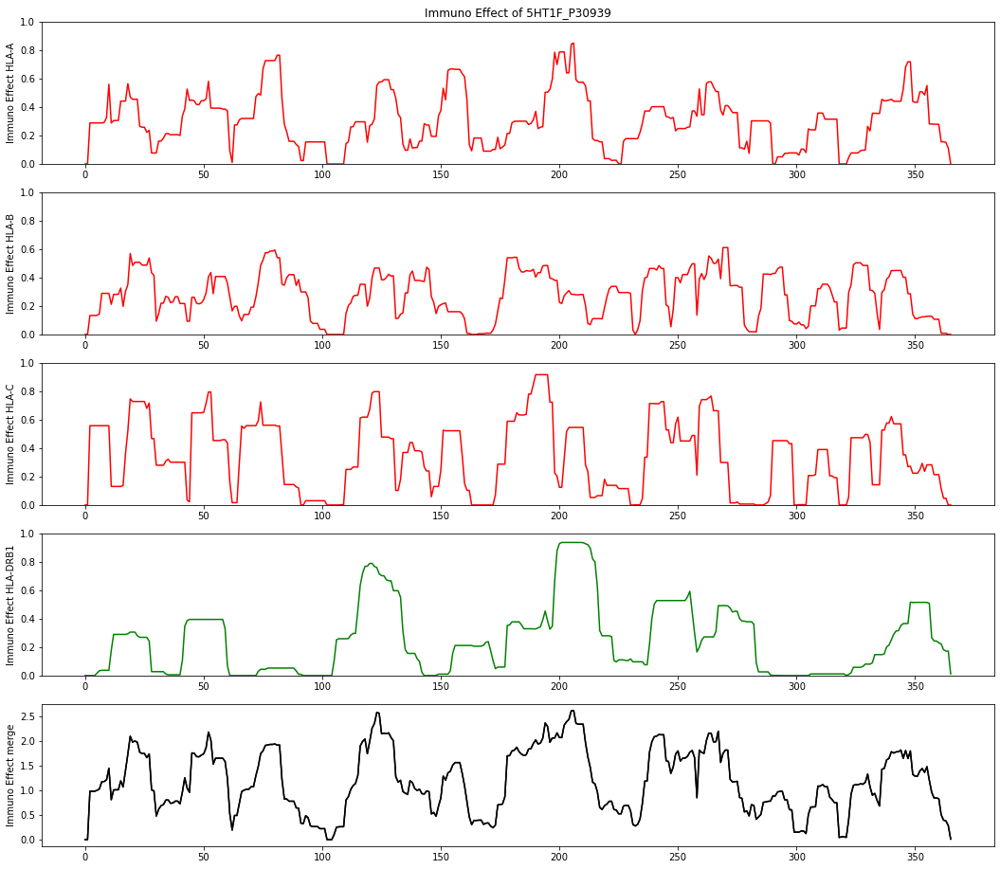

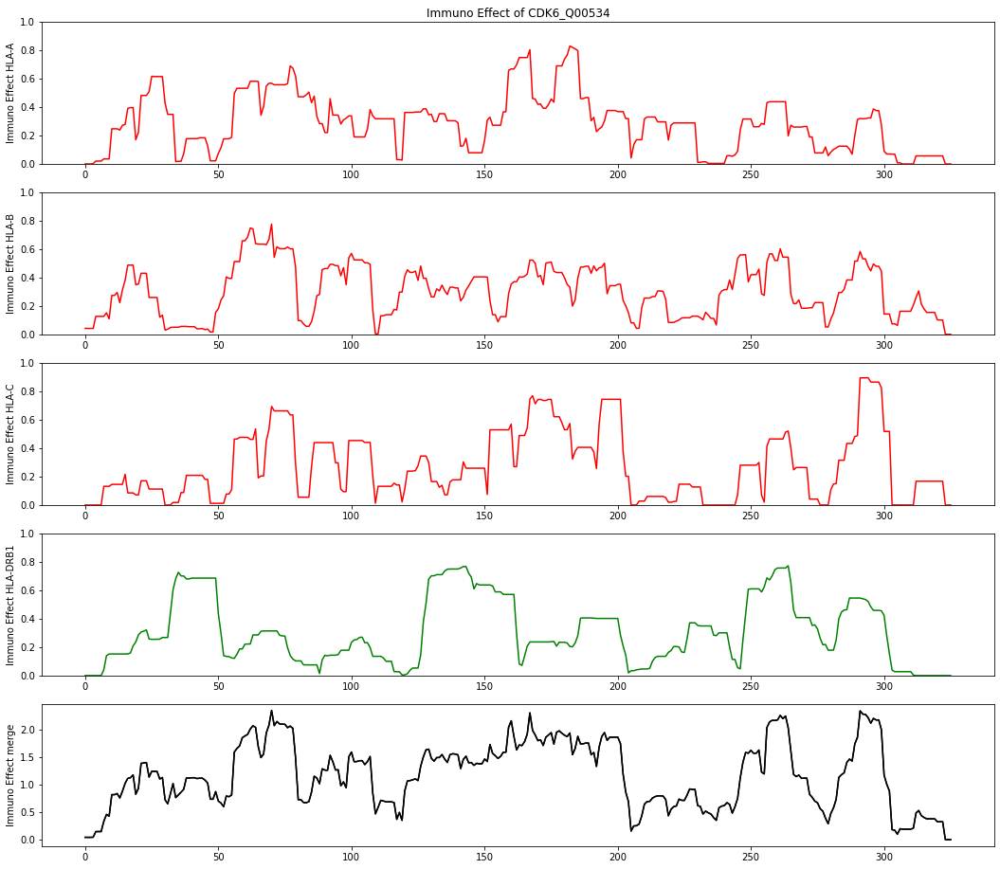

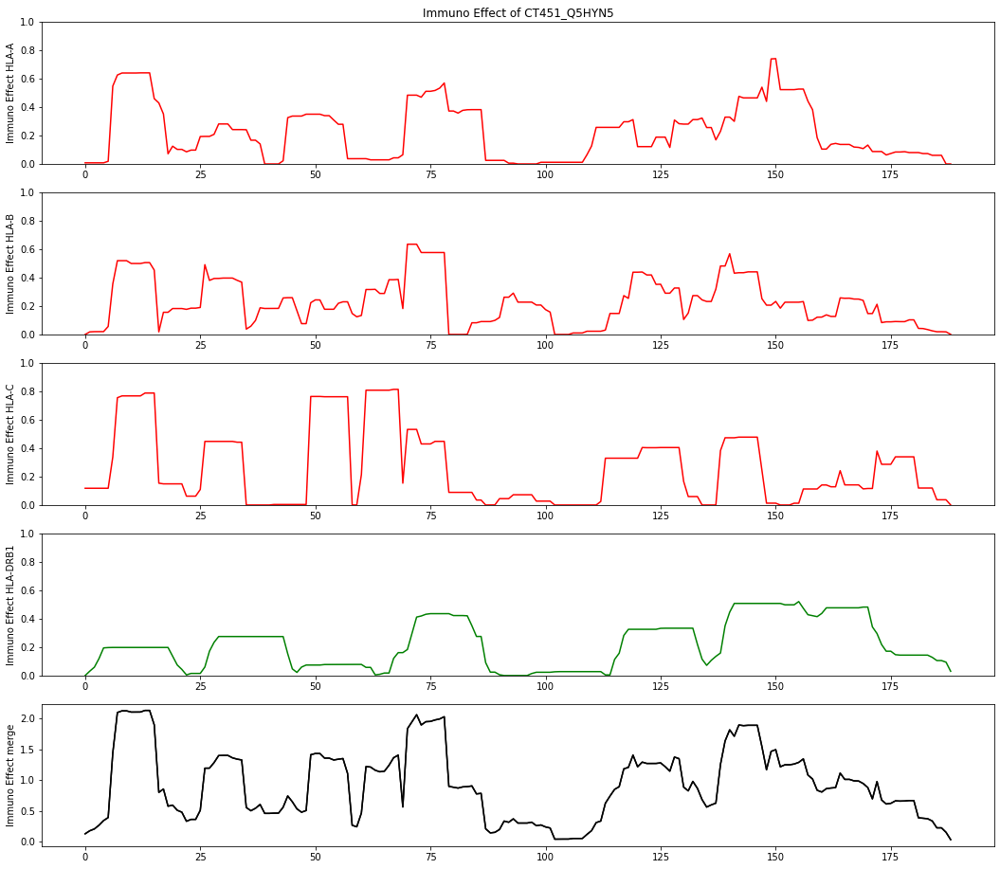

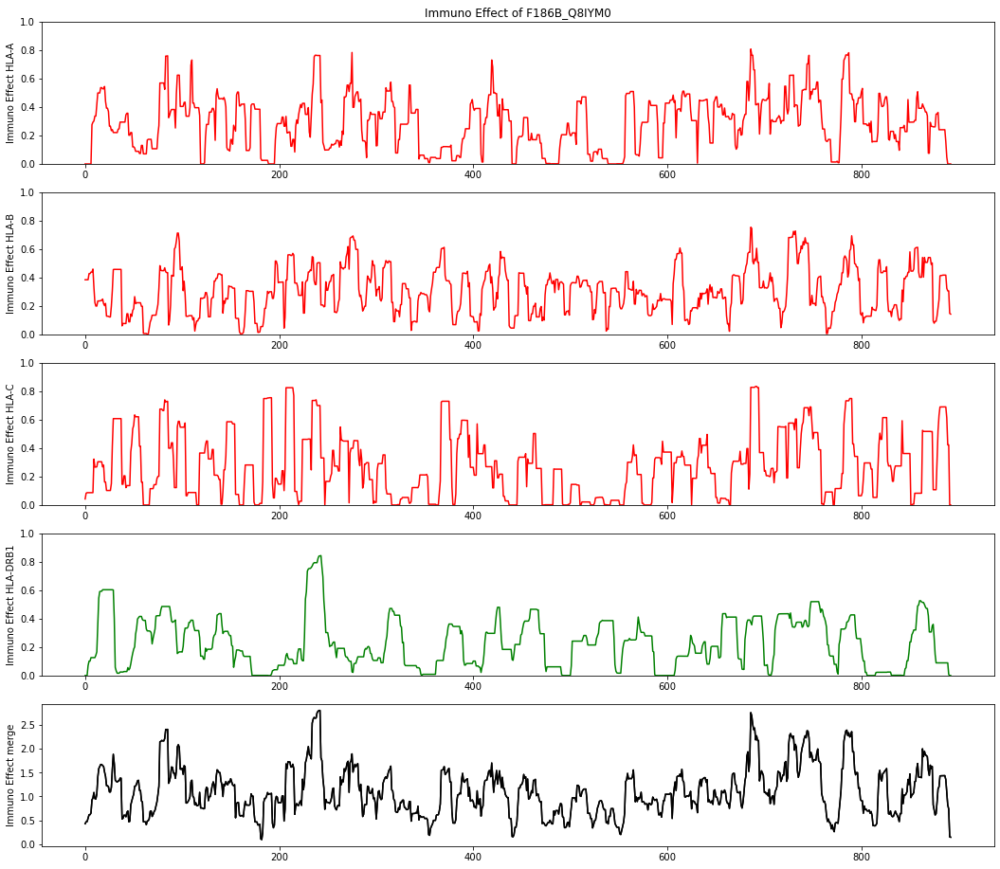

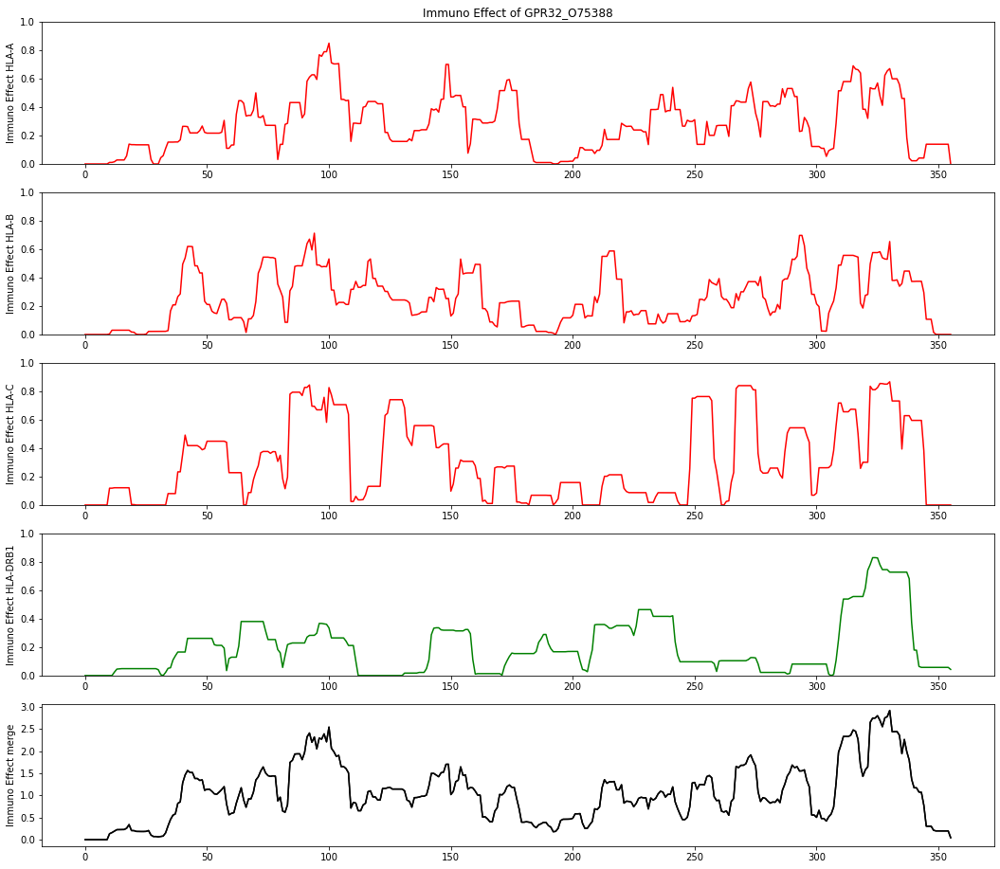

...

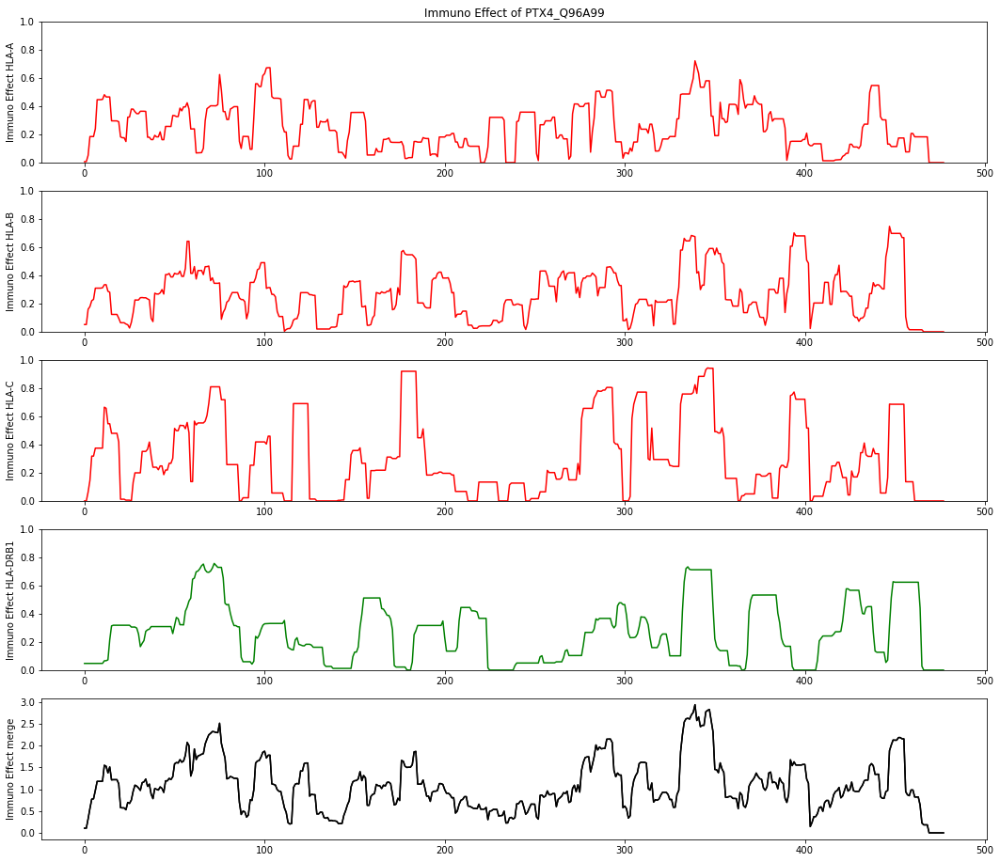

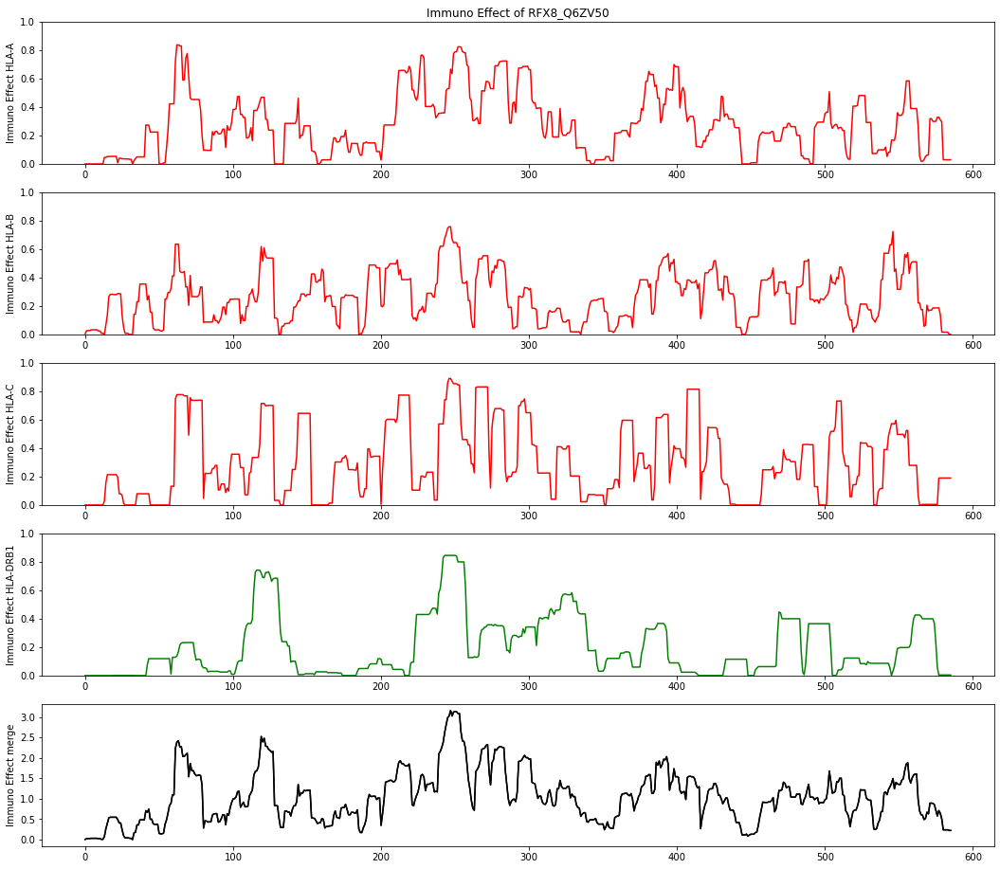

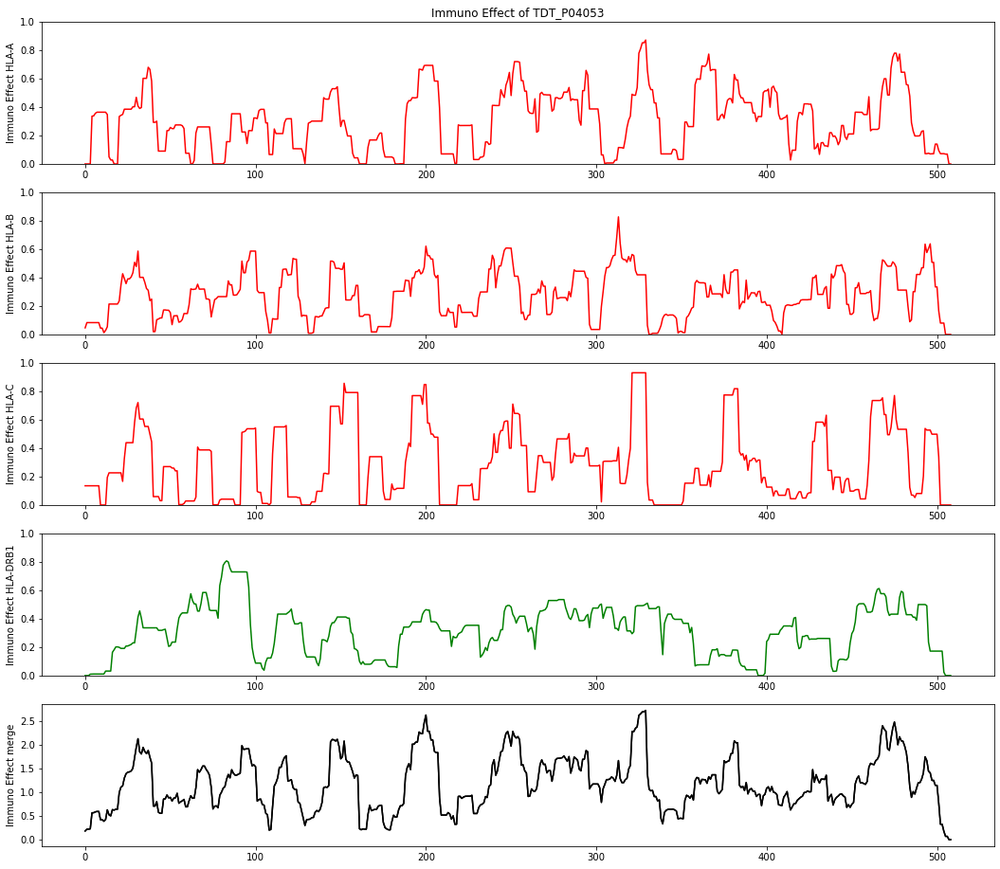

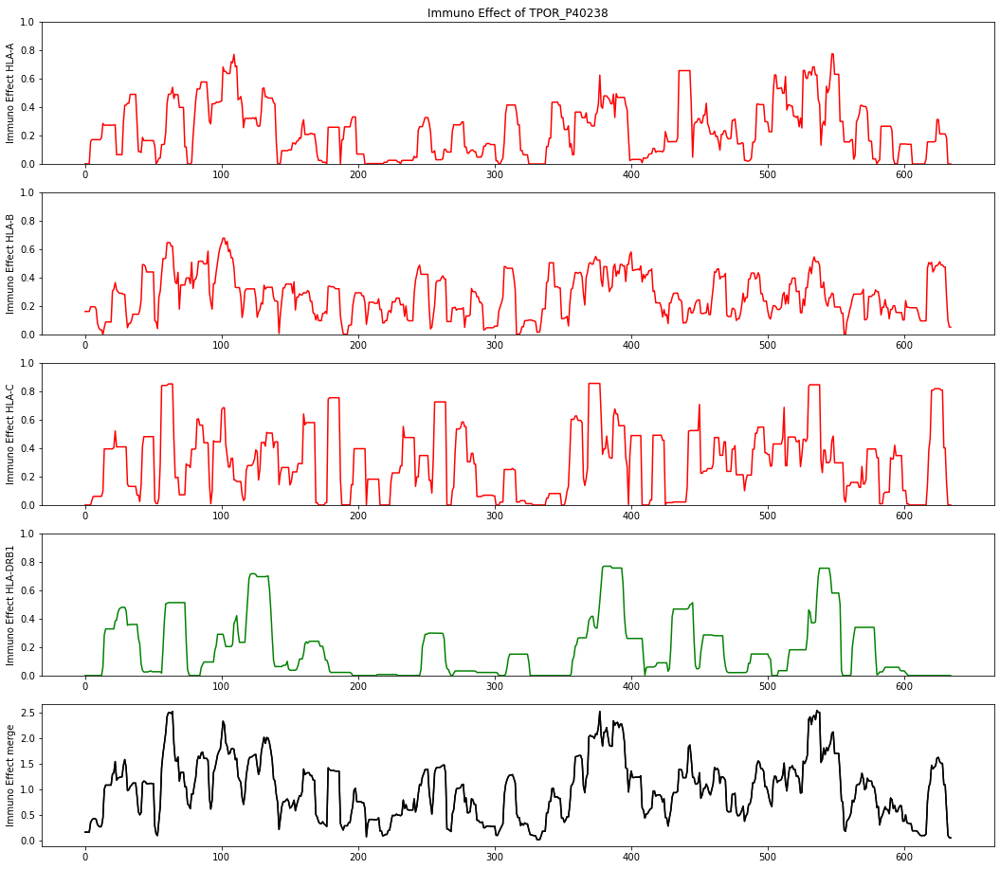

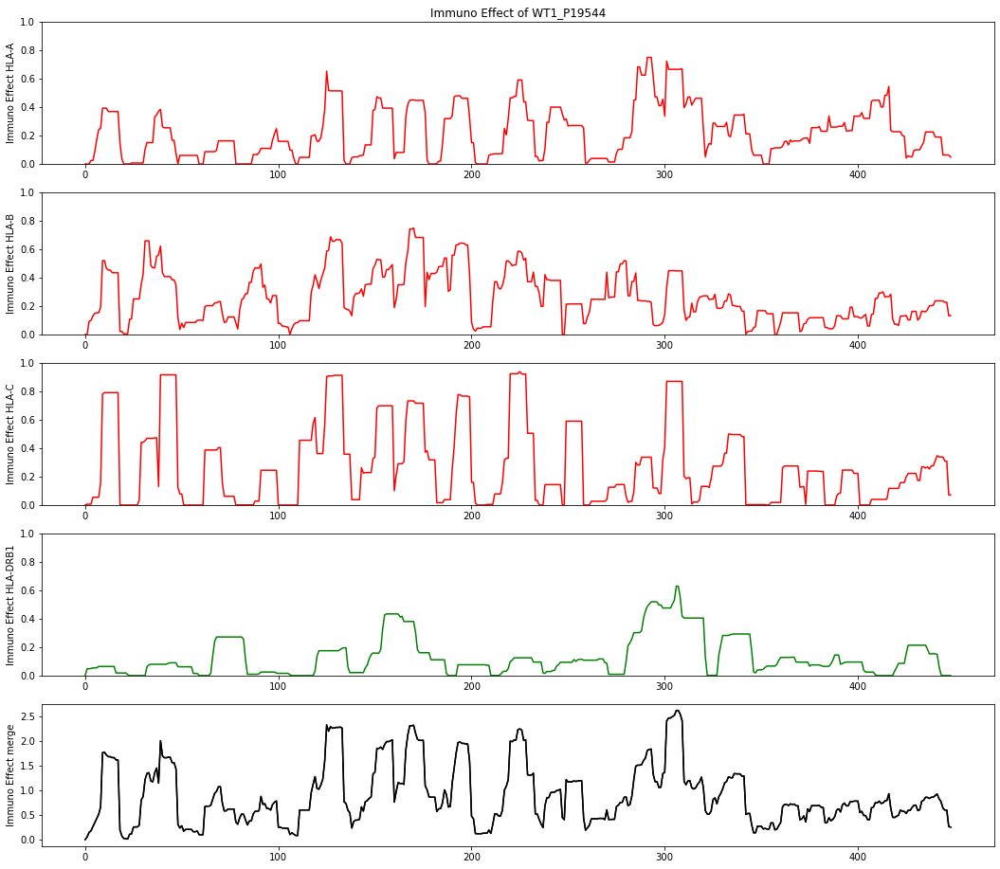

In [127]:
for TAA in Immuno_eff_all_allele_dict_withhomo:
    fig,(ax_hlaA,ax_hlaB,ax_hlaC,ax_hlaDRB1,ax_merge) = plt.subplots(5,1,figsize=(18,16))
    
    for key in Immuno_eff_all_allele_dict_withhomo[TAA]:
        if key != "selectregionnum":
            pro_len = len(Immuno_eff_all_allele_dict_withhomo[TAA]["seq"])
            x = list(range(pro_len))
            y = np.asarray(Immuno_eff_all_allele_dict_withhomo[TAA][key])
            if key=="hlaA":
                ax_hlaA.plot(x,y,color="red")
                ax_hlaA.set_ylim(0,1)
                ax_hlaA.title.set_text("Immuno Effect of {}".format(TAA))
                ax_hlaA.set_ylabel("Immuno Effect HLA-A",size=10)
            elif key=="hlaB":
                ax_hlaB.plot(x,y,color="red")
                ax_hlaB.set_ylim(0,1)
                ax_hlaB.set_ylabel("Immuno Effect HLA-B",size=10)
            elif key=="hlaC":
                ax_hlaC.plot(x,y,color="red")
                ax_hlaC.set_ylim(0,1)
                ax_hlaC.set_ylabel("Immuno Effect HLA-C",size=10)
            elif key=="hlaDRB1":
                ax_hlaDRB1.plot(x,y,color="green")
                ax_hlaDRB1.set_ylim(0,1)
                ax_hlaDRB1.set_ylabel("Immuno Effect HLA-DRB1",size=10)
            elif key=="allele_merge":
                ax_merge.plot(x,y,color="black")
                #ax_merge.set_ylim(0.0,5.0)
                ax_merge.set_ylabel("Immuno Effect merge",size=10)
                ax_merge.plot(x,y,color="black")
    plt.show()
    #input("please enter your input")

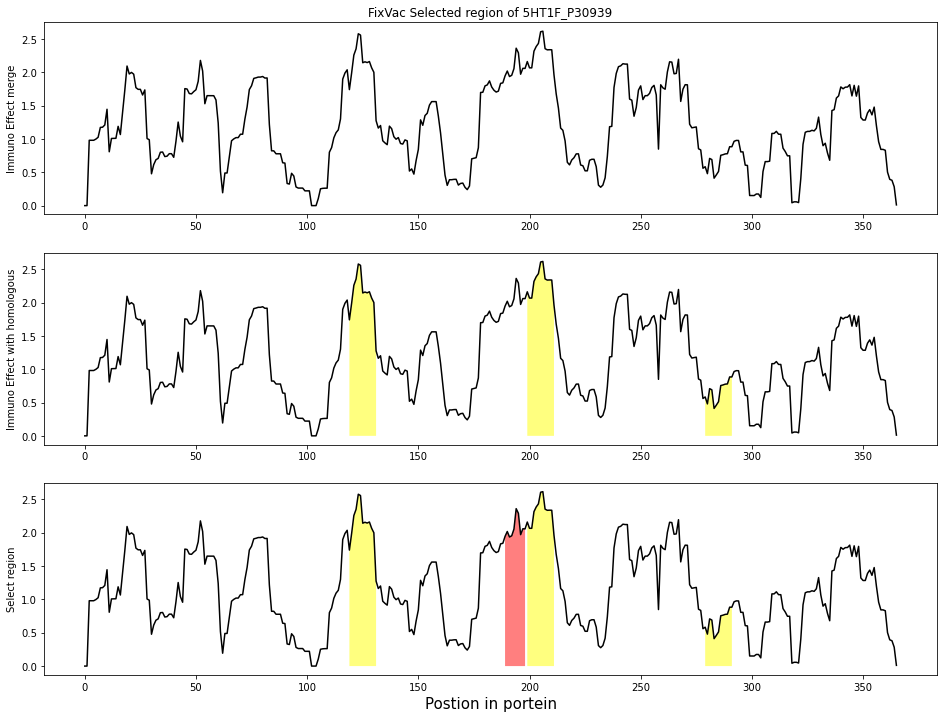

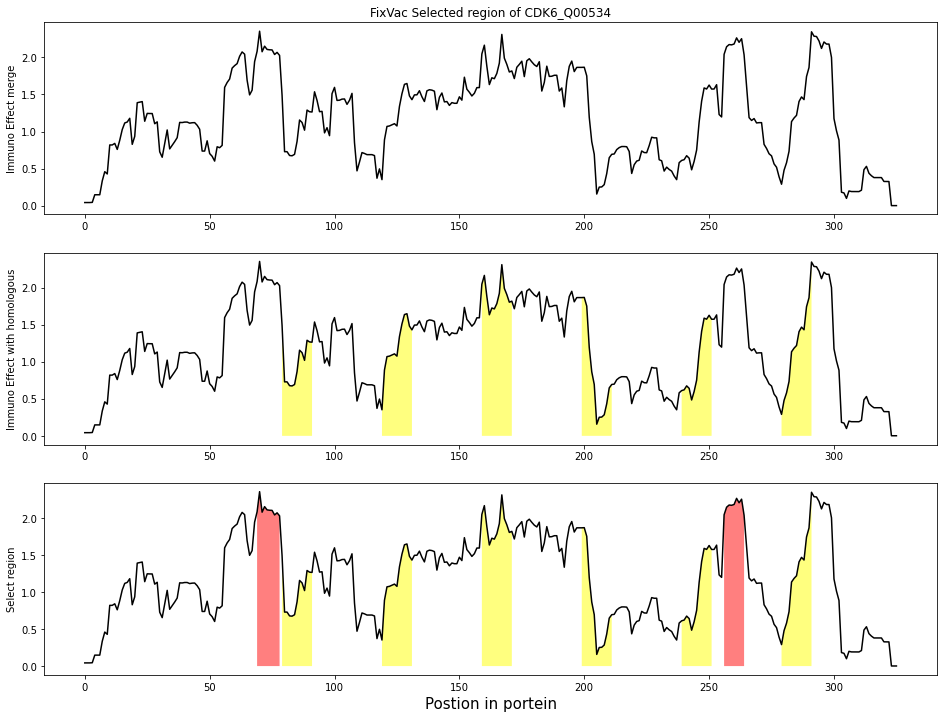

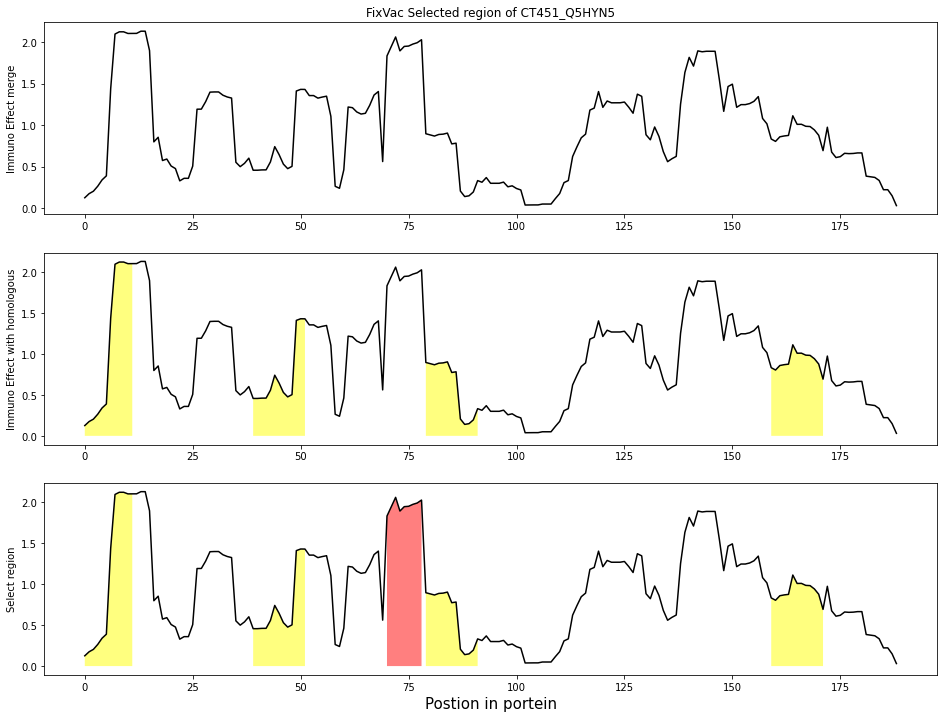

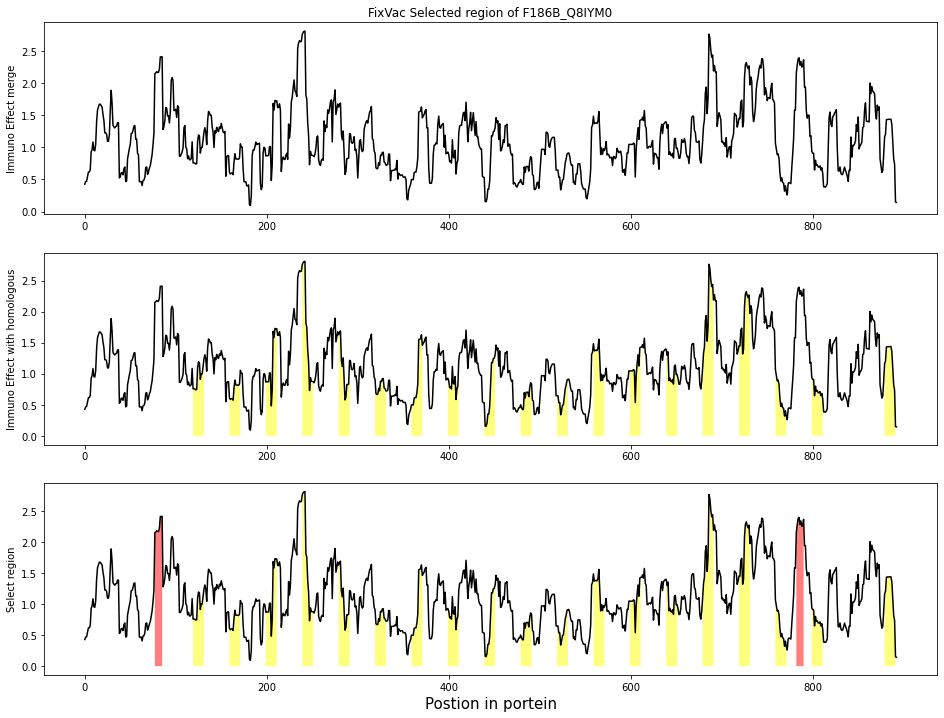

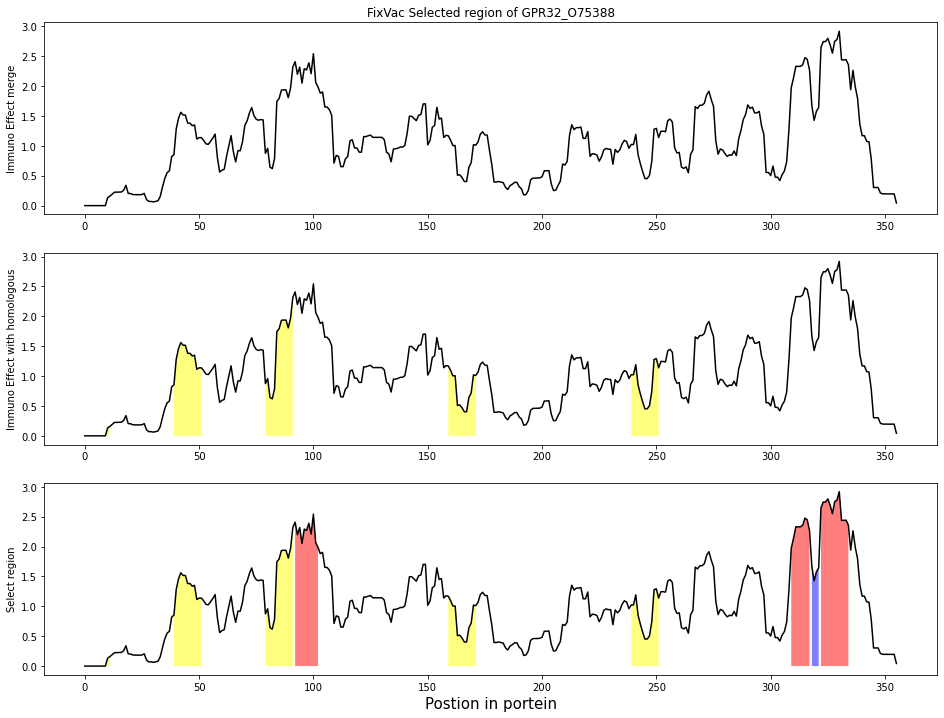

...

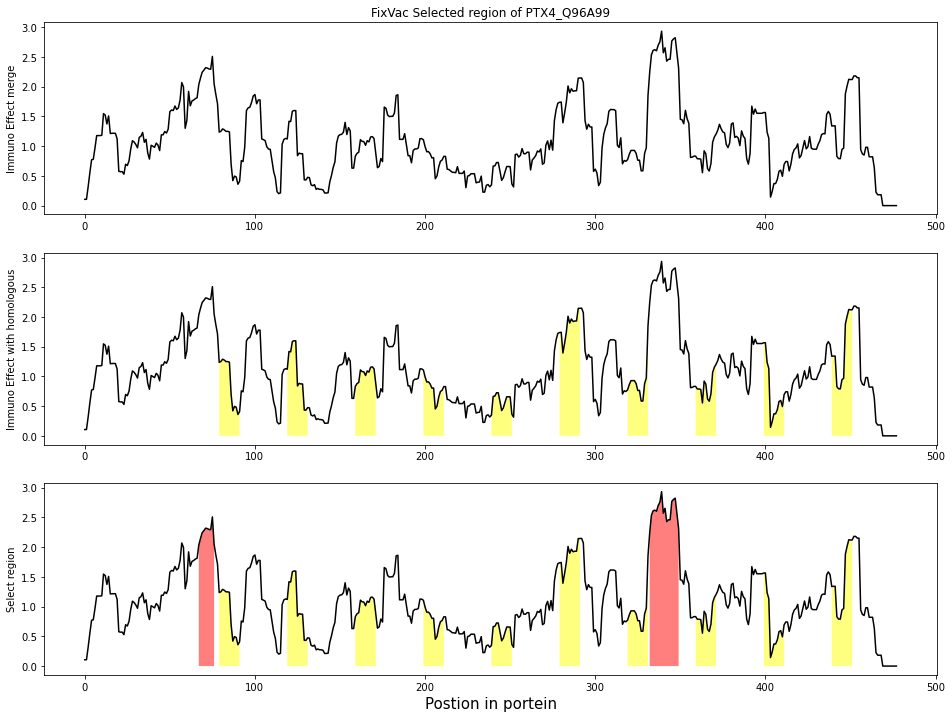

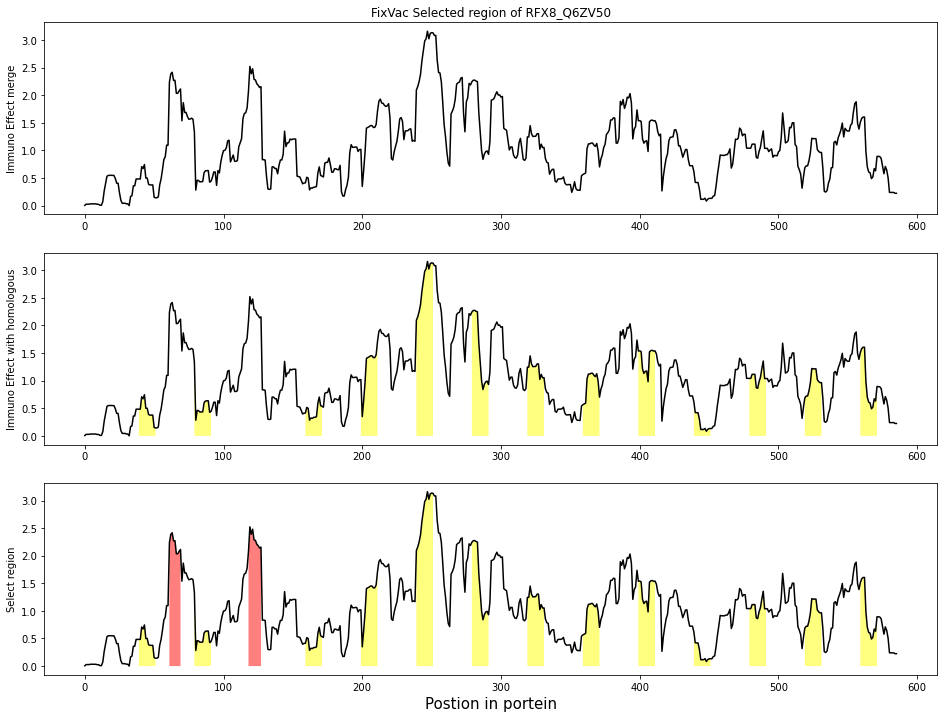

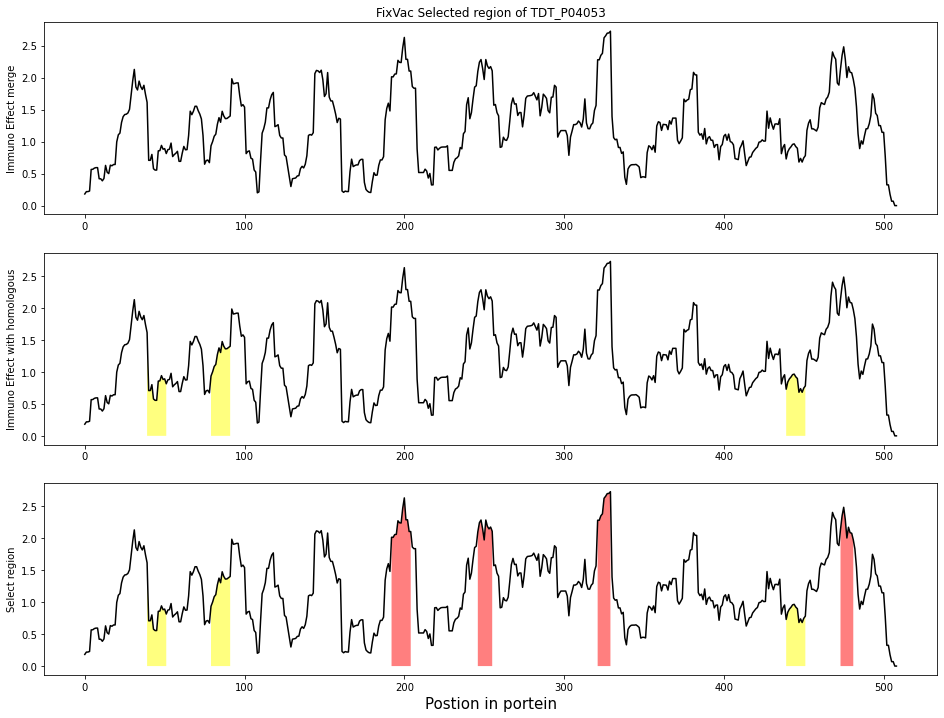

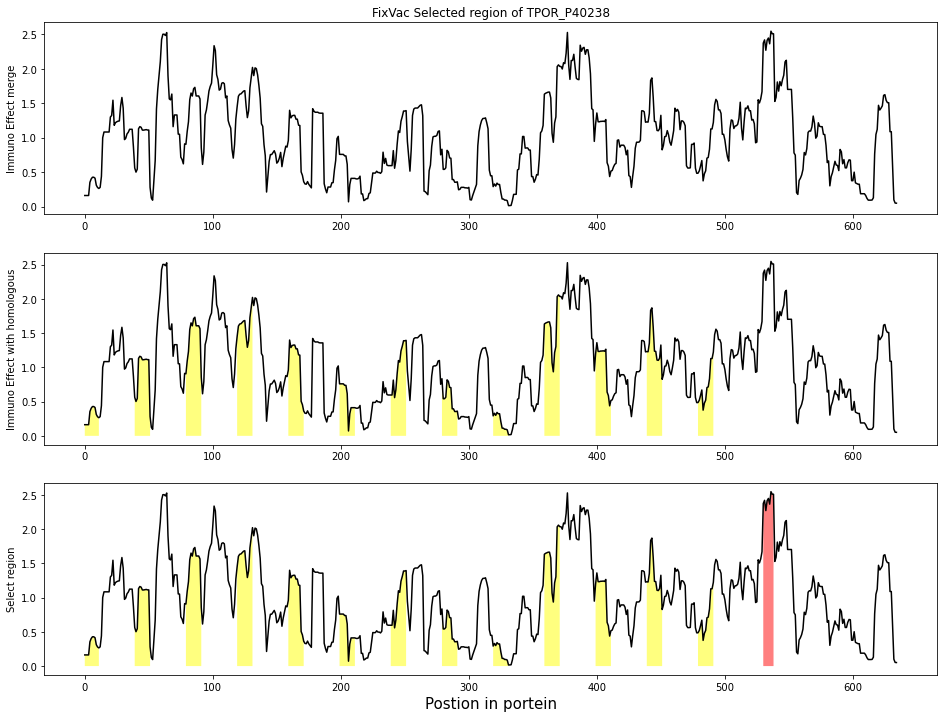

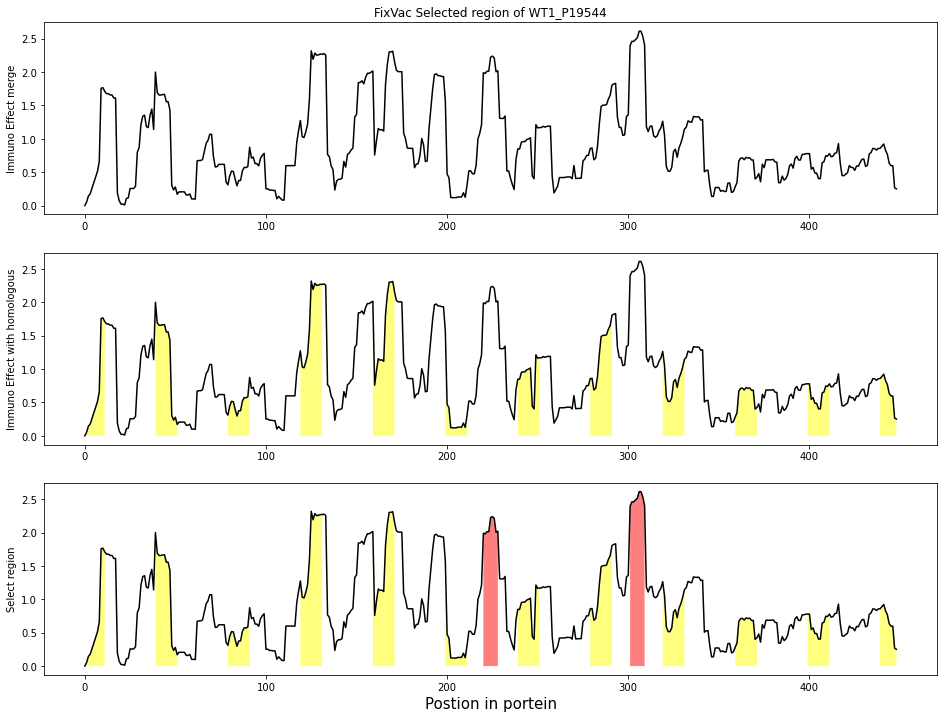

In [128]:
for TAA in Immuno_eff_all_allele_dict_withhomo:
    fig,(ax_merge,ax_withhomo,ax_selectregion) = plt.subplots(3,1,figsize=(16,12))
    for key in Immuno_eff_all_allele_dict_withhomo[TAA]:
        if key != "selectregionnum":
            pro_len = len(Immuno_eff_all_allele_dict_withhomo[TAA]["seq"])
            x = list(range(pro_len))
            y = np.asarray(Immuno_eff_all_allele_dict_withhomo[TAA][key])
            if key=="allele_merge":
                #print([float(format(i, '.4f')) for i in Immuno_eff_all_allele_dict_withhomo[TAA][key]])
                y2 = y
                ax_merge.plot(x,y,color="black")
                #ax_merge.set_ylim(0.0,5.0)
                ax_merge.set_ylabel("Immuno Effect merge",size=10)
                ax_merge.title.set_text("FixVac Selected region of {}".format(TAA))
                ax_withhomo.plot(x,y,color="black")
                ax_selectregion.plot(x,y, color="black")
            elif key=="withhomo":
                ax_withhomo.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_selectregion.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_withhomo.set_ylabel("Immuno Effect with homologous",size=10)
            elif key=="selectregion":
                y1_a = np.asarray([immu_eff_merge_init for i in range(pro_len)])
                y1_b = np.asarray([0 for i in range(pro_len)])
                ax_selectregion.fill_between(x,0,y2, where = y==10,facecolor='red',alpha=0.5)
                ax_selectregion.fill_between(x,0,y2, where = y==100,facecolor='blue',alpha=0.5)
                ax_selectregion.set_xlabel("Postion in portein",size=15)
                ax_selectregion.set_ylabel("Select region",size=10)
                #ax_selectregion.legend()
    plt.show()
    #input("please enter your input")

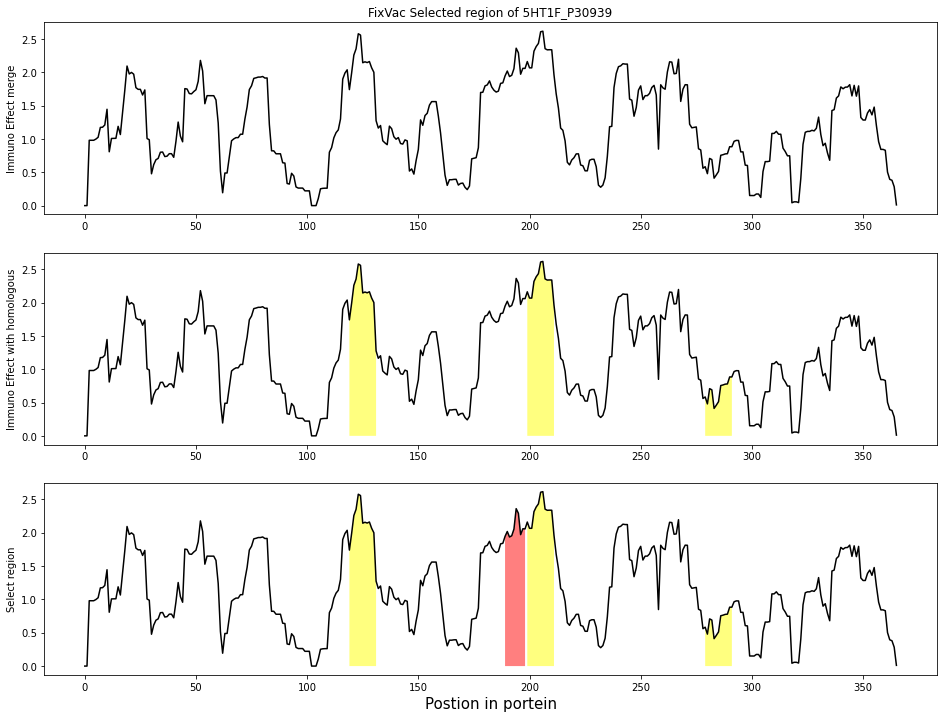

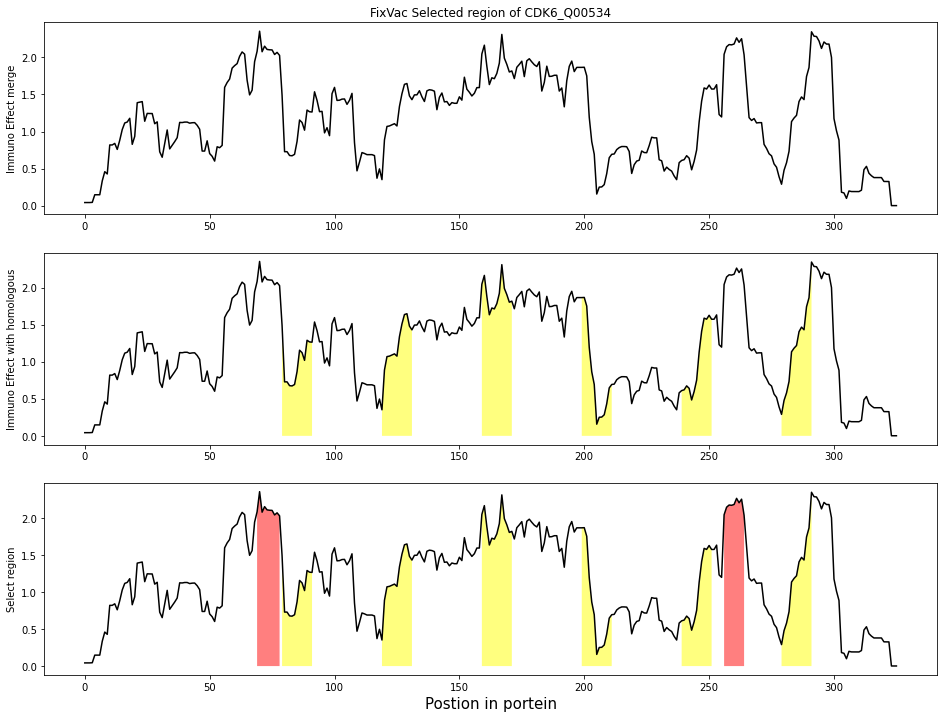

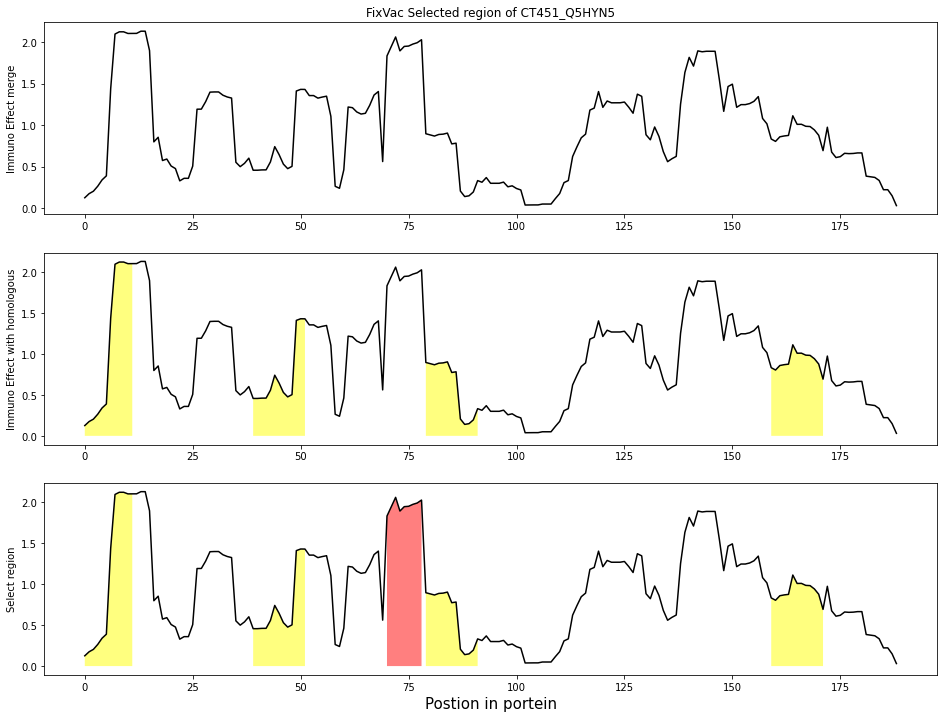

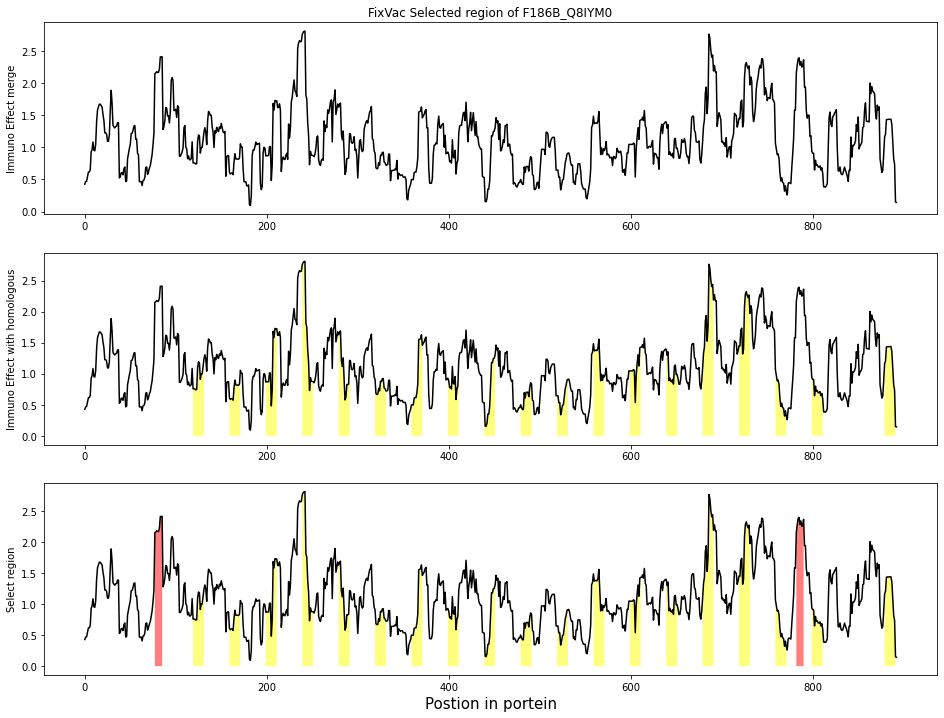

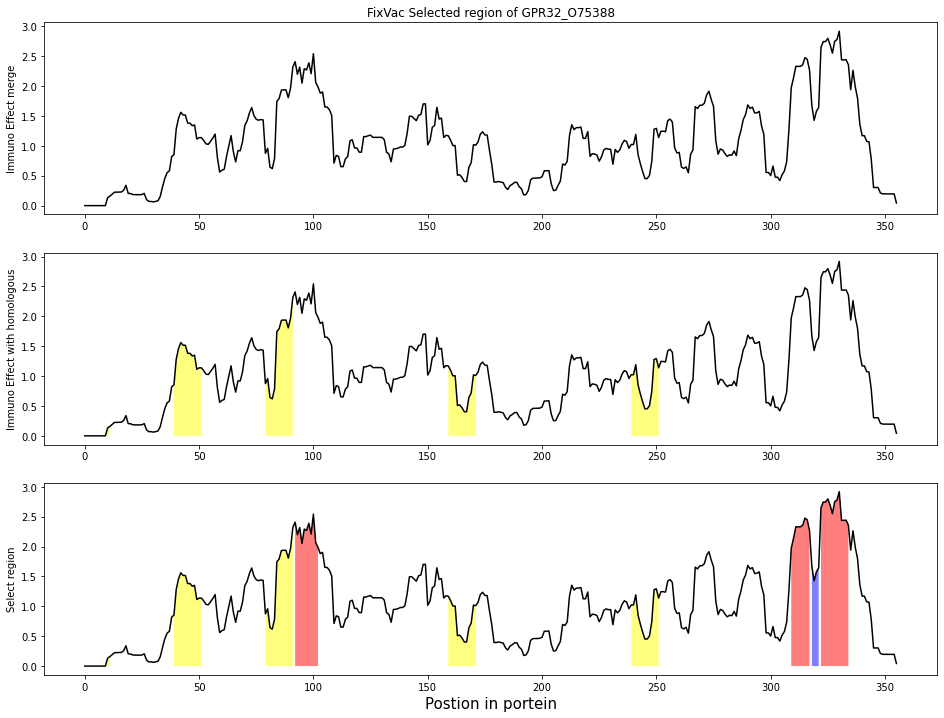

...

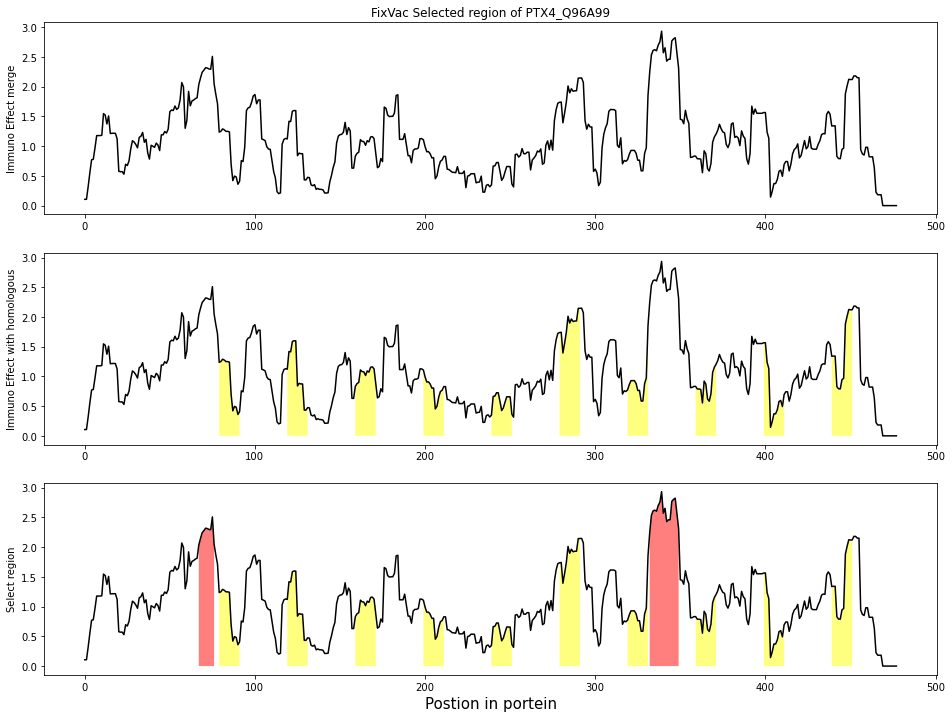

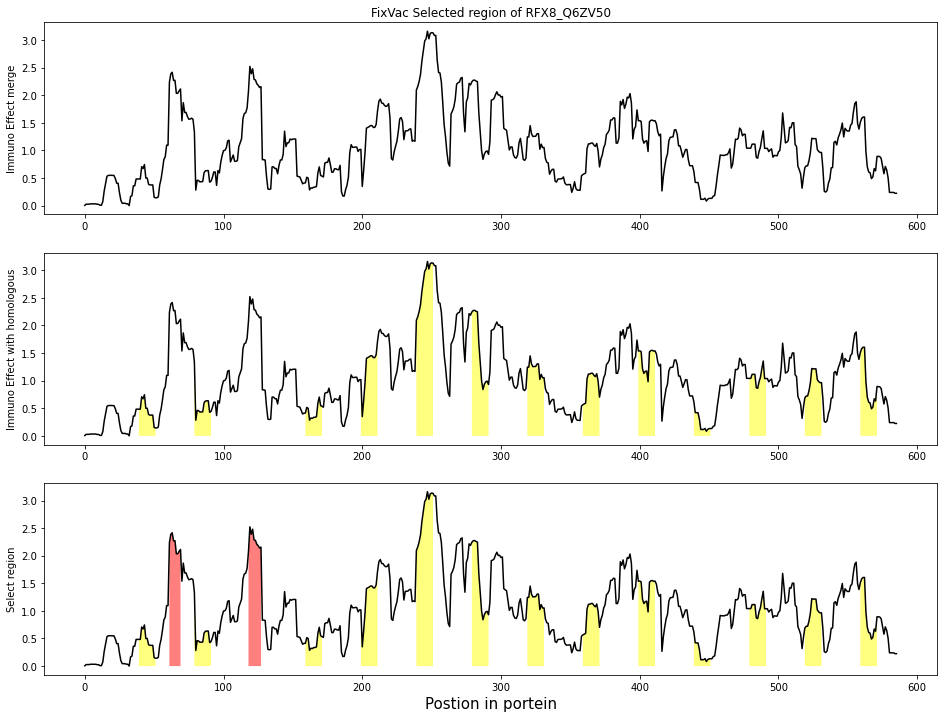

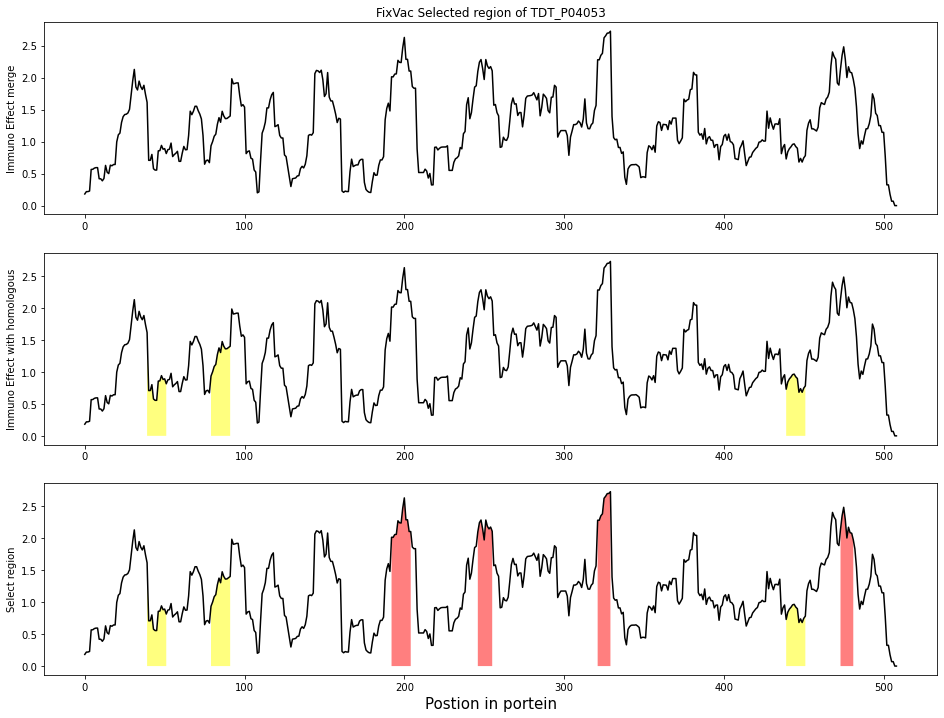

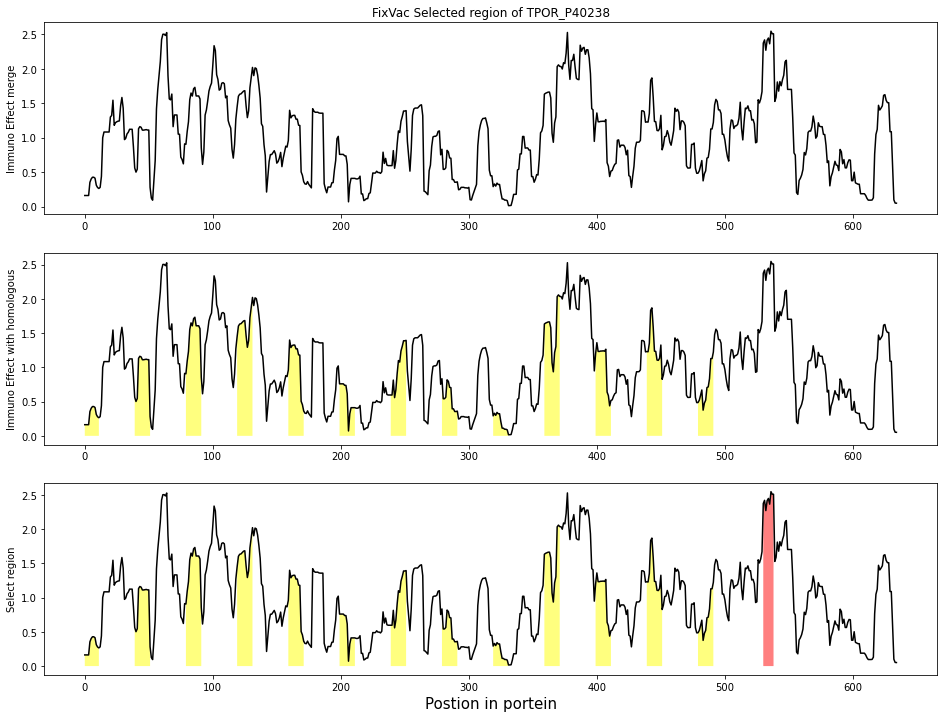

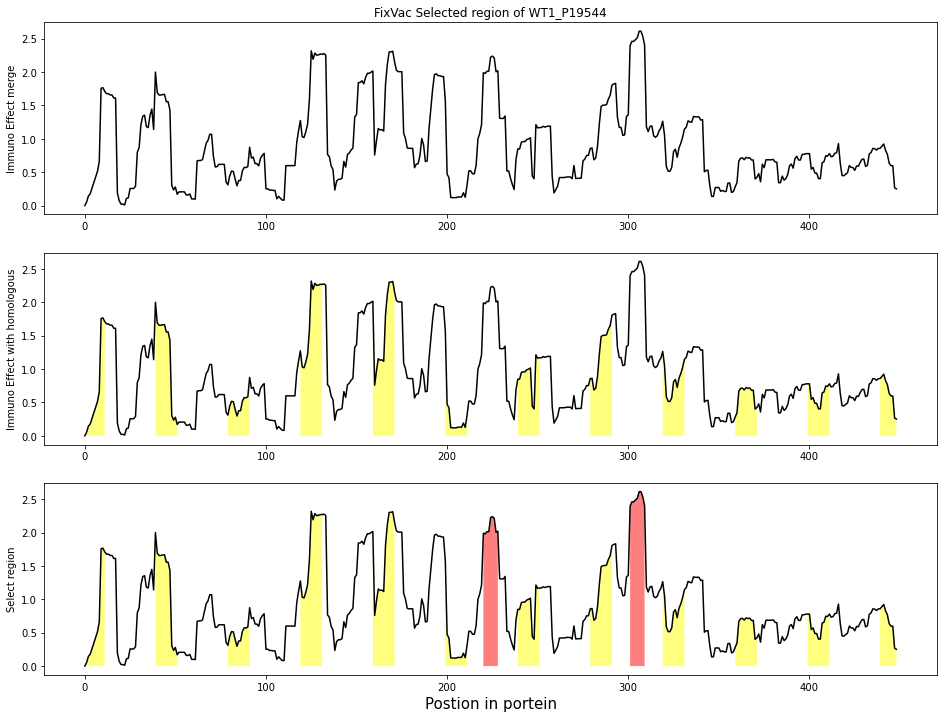

In [128]:
for TAA in Immuno_eff_all_allele_dict_withhomo:
    fig,(ax_merge,ax_withhomo,ax_selectregion) = plt.subplots(3,1,figsize=(16,12))
    for key in Immuno_eff_all_allele_dict_withhomo[TAA]:
        if key != "selectregionnum":
            pro_len = len(Immuno_eff_all_allele_dict_withhomo[TAA]["seq"])
            x = list(range(pro_len))
            y = np.asarray(Immuno_eff_all_allele_dict_withhomo[TAA][key])
            if key=="allele_merge":
                #print([float(format(i, '.4f')) for i in Immuno_eff_all_allele_dict_withhomo[TAA][key]])
                y2 = y
                ax_merge.plot(x,y,color="black")
                #ax_merge.set_ylim(0.0,5.0)
                ax_merge.set_ylabel("Immuno Effect merge",size=10)
                ax_merge.title.set_text("FixVac Selected region of {}".format(TAA))
                ax_withhomo.plot(x,y,color="black")
                ax_selectregion.plot(x,y, color="black")
            elif key=="withhomo":
                ax_withhomo.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_selectregion.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_withhomo.set_ylabel("Immuno Effect with homologous",size=10)
            elif key=="selectregion":
                y1_a = np.asarray([immu_eff_merge_init for i in range(pro_len)])
                y1_b = np.asarray([0 for i in range(pro_len)])
                ax_selectregion.fill_between(x,0,y2, where = y==10,facecolor='red',alpha=0.5)
                ax_selectregion.fill_between(x,0,y2, where = y==100,facecolor='blue',alpha=0.5)
                ax_selectregion.set_xlabel("Postion in portein",size=15)
                ax_selectregion.set_ylabel("Select region",size=10)
                #ax_selectregion.legend()
    plt.show()
    #input("please enter your input")

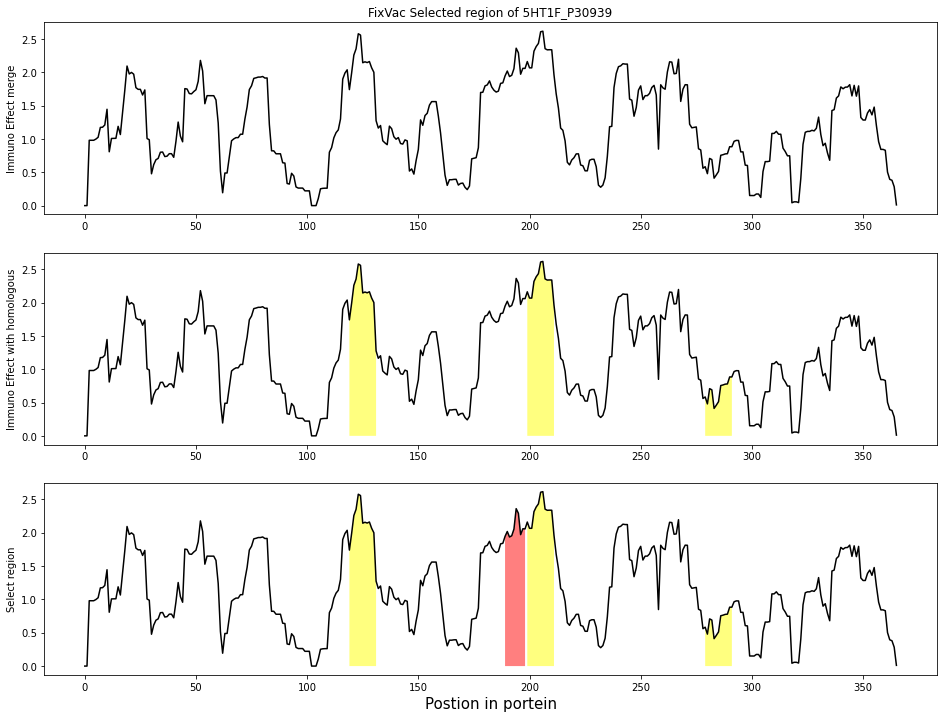

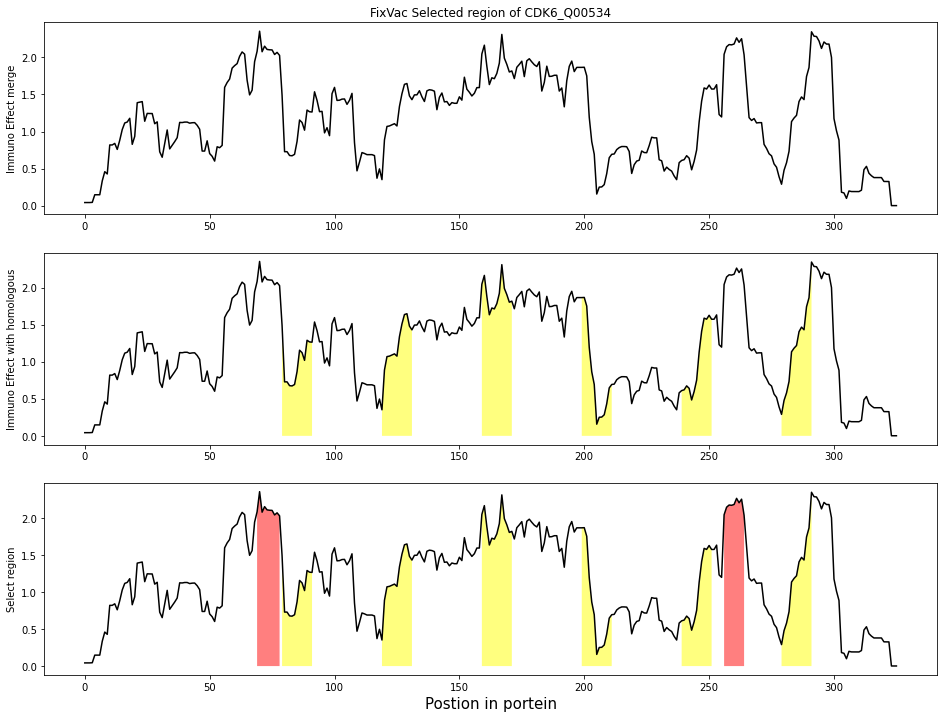

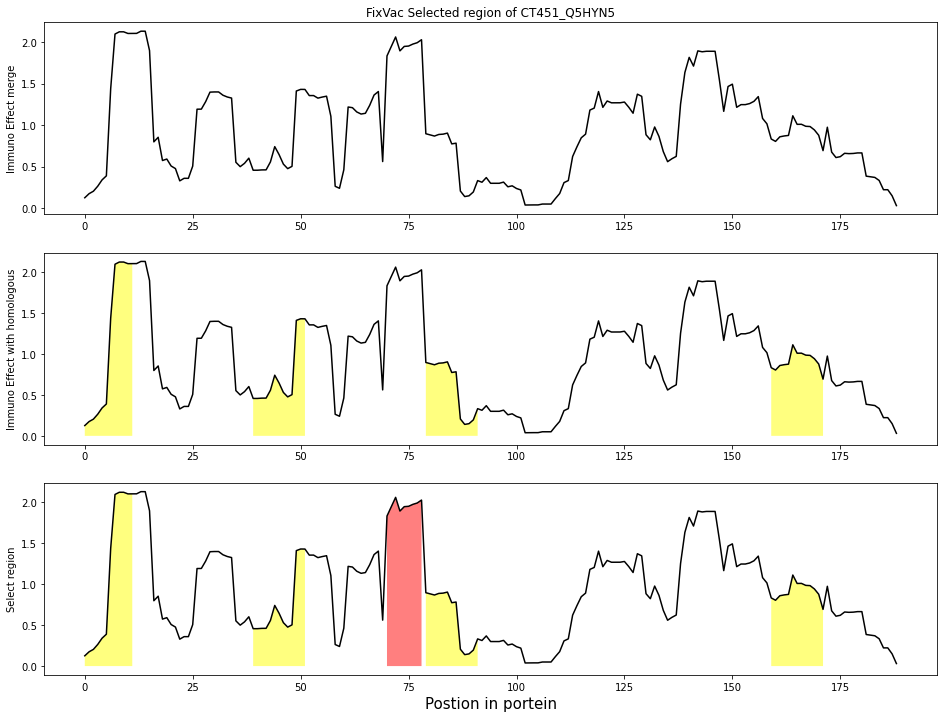

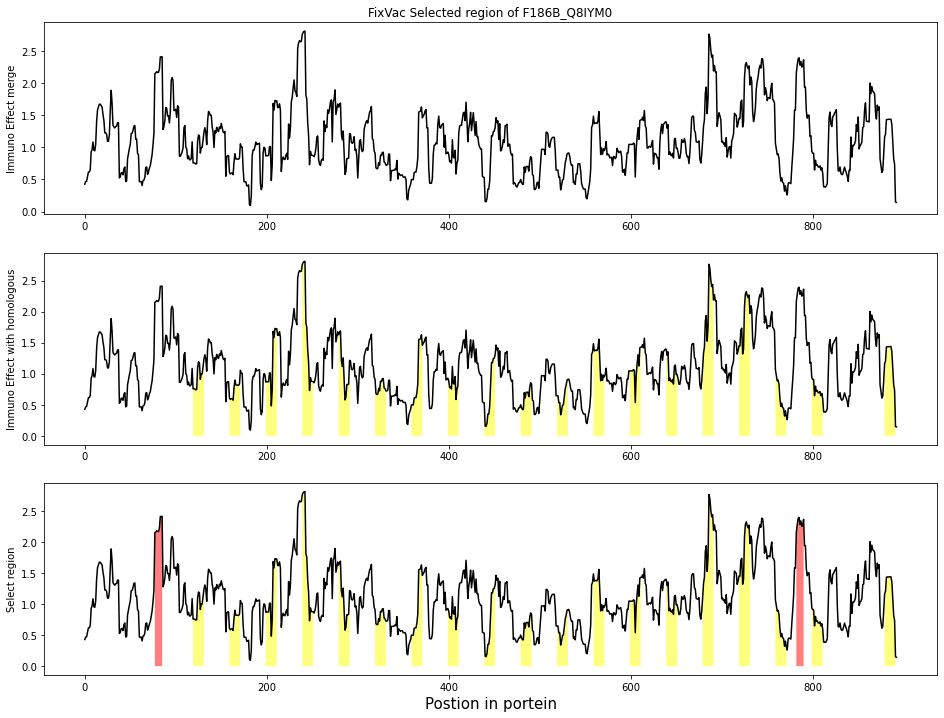

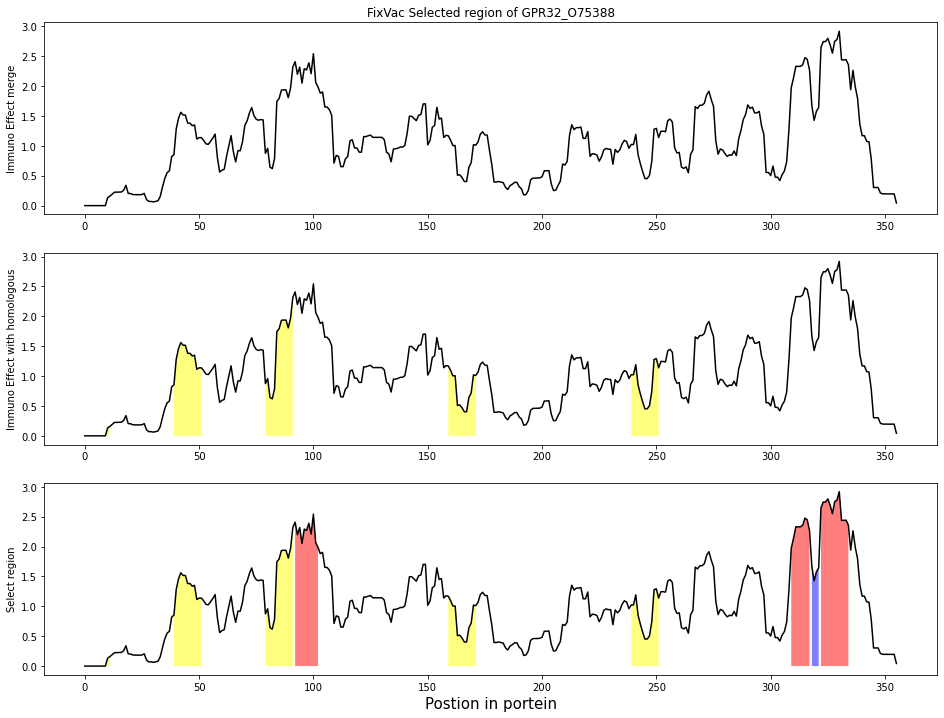

...

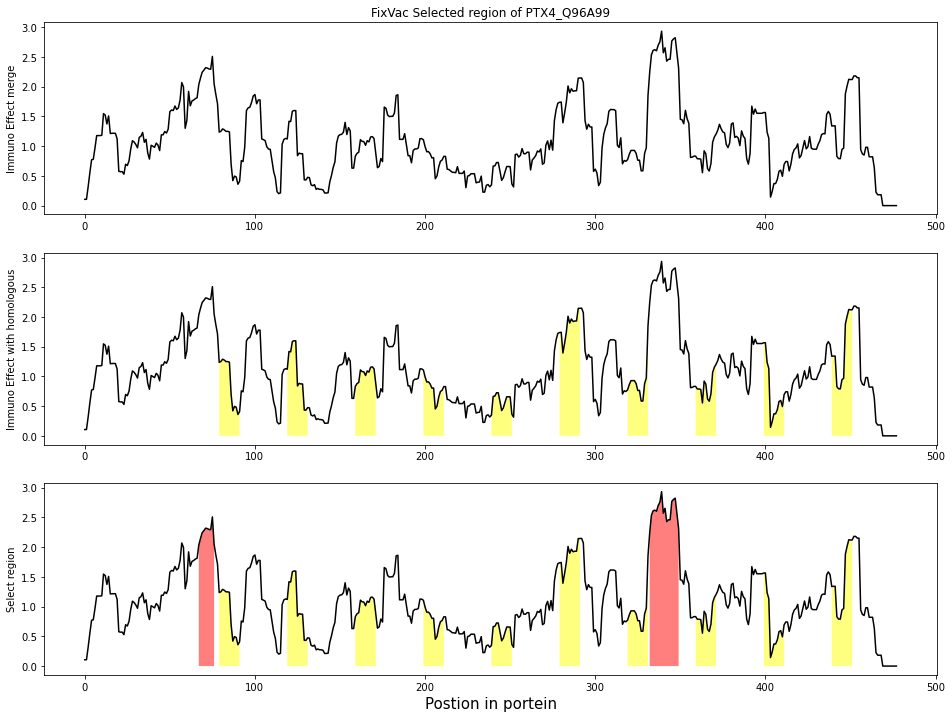

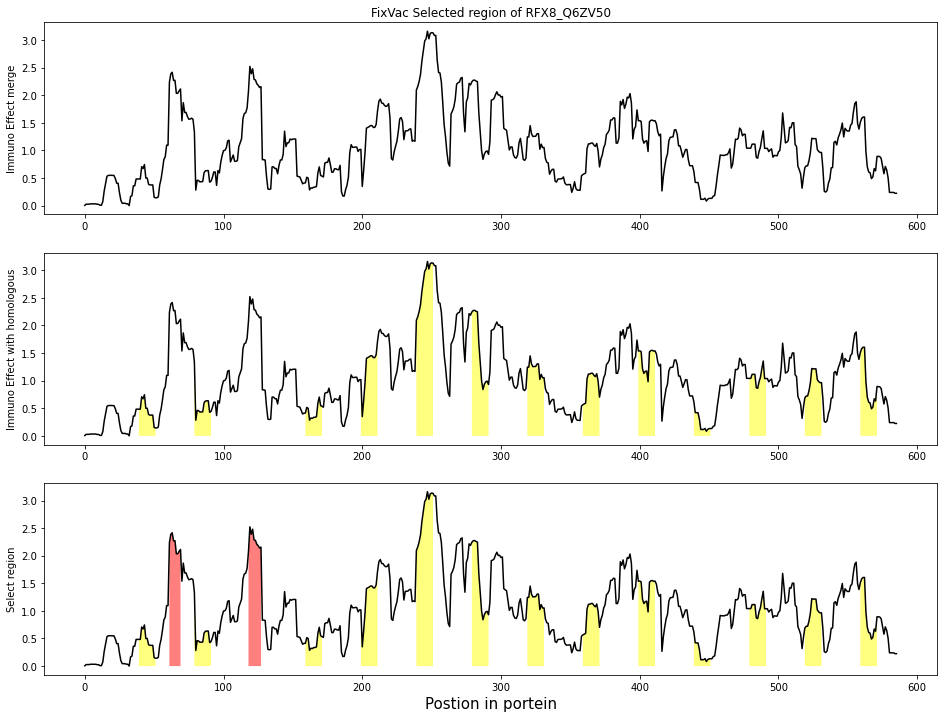

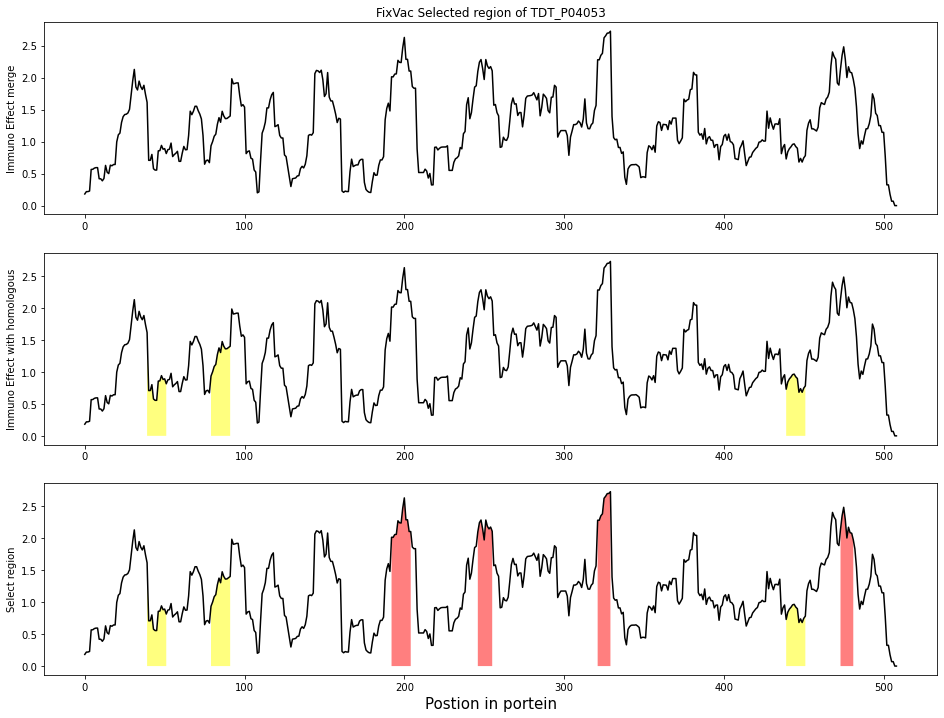

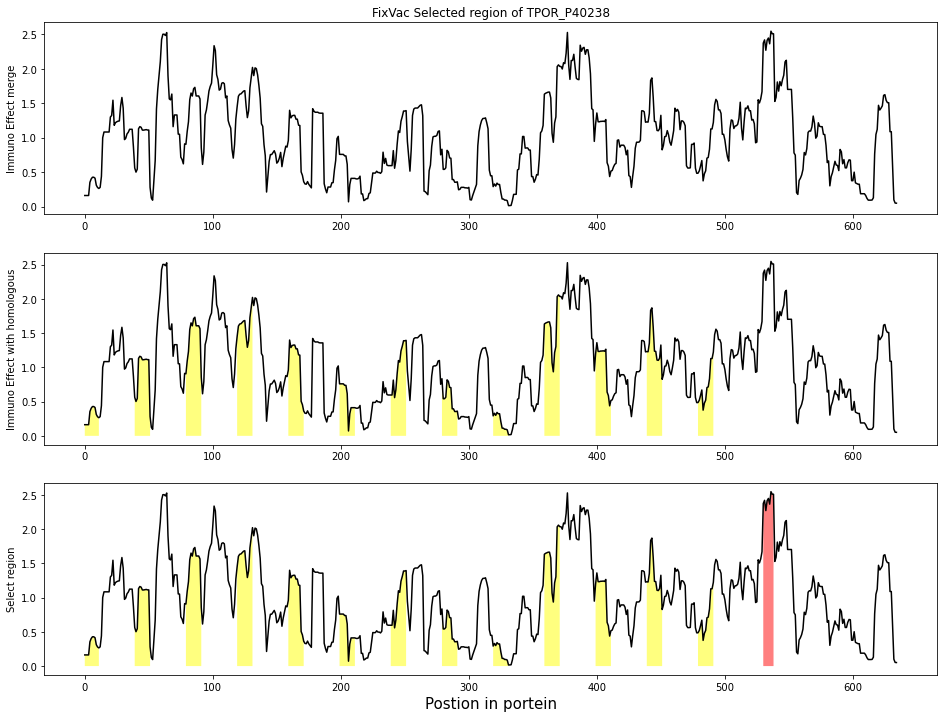

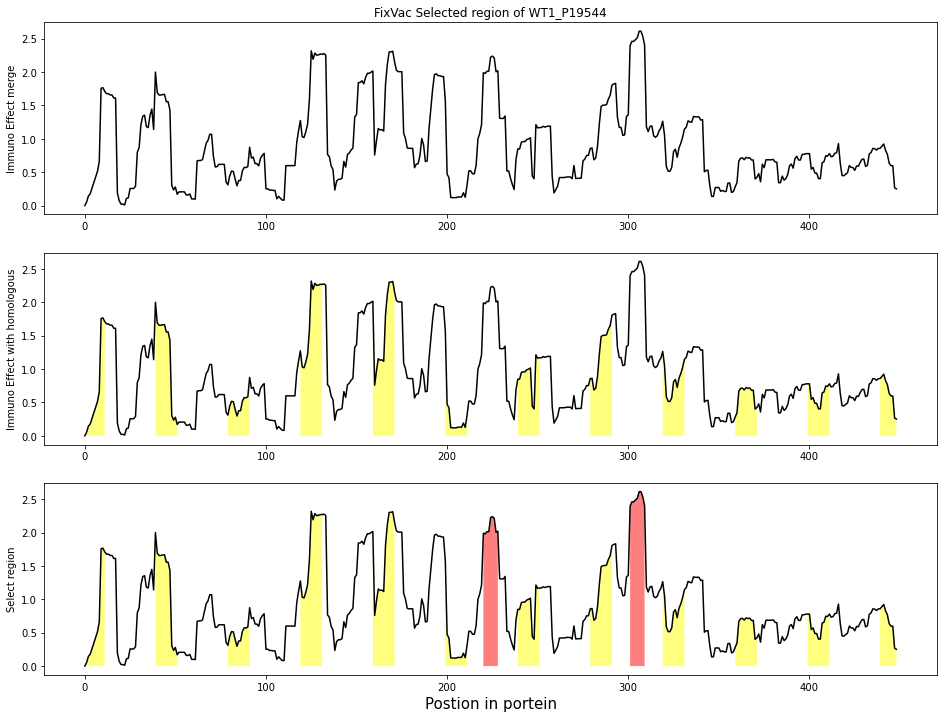

In [128]:
for TAA in Immuno_eff_all_allele_dict_withhomo:
    fig,(ax_merge,ax_withhomo,ax_selectregion) = plt.subplots(3,1,figsize=(16,12))
    for key in Immuno_eff_all_allele_dict_withhomo[TAA]:
        if key != "selectregionnum":
            pro_len = len(Immuno_eff_all_allele_dict_withhomo[TAA]["seq"])
            x = list(range(pro_len))
            y = np.asarray(Immuno_eff_all_allele_dict_withhomo[TAA][key])
            if key=="allele_merge":
                #print([float(format(i, '.4f')) for i in Immuno_eff_all_allele_dict_withhomo[TAA][key]])
                y2 = y
                ax_merge.plot(x,y,color="black")
                #ax_merge.set_ylim(0.0,5.0)
                ax_merge.set_ylabel("Immuno Effect merge",size=10)
                ax_merge.title.set_text("FixVac Selected region of {}".format(TAA))
                ax_withhomo.plot(x,y,color="black")
                ax_selectregion.plot(x,y, color="black")
            elif key=="withhomo":
                ax_withhomo.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_selectregion.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_withhomo.set_ylabel("Immuno Effect with homologous",size=10)
            elif key=="selectregion":
                y1_a = np.asarray([immu_eff_merge_init for i in range(pro_len)])
                y1_b = np.asarray([0 for i in range(pro_len)])
                ax_selectregion.fill_between(x,0,y2, where = y==10,facecolor='red',alpha=0.5)
                ax_selectregion.fill_between(x,0,y2, where = y==100,facecolor='blue',alpha=0.5)
                ax_selectregion.set_xlabel("Postion in portein",size=15)
                ax_selectregion.set_ylabel("Select region",size=10)
                #ax_selectregion.legend()
    plt.show()
    #input("please enter your input")

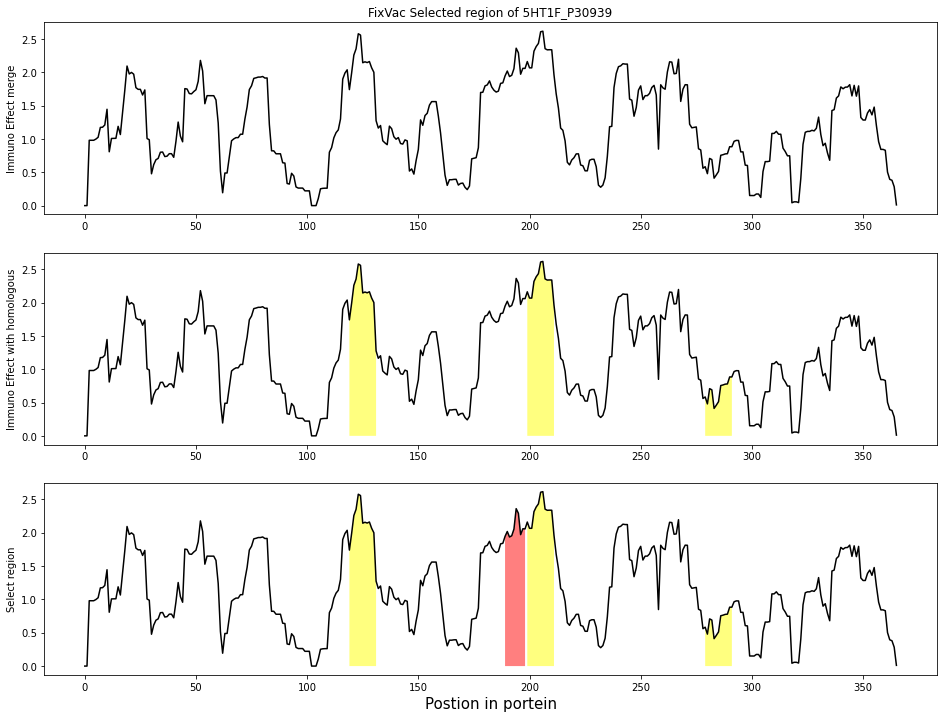

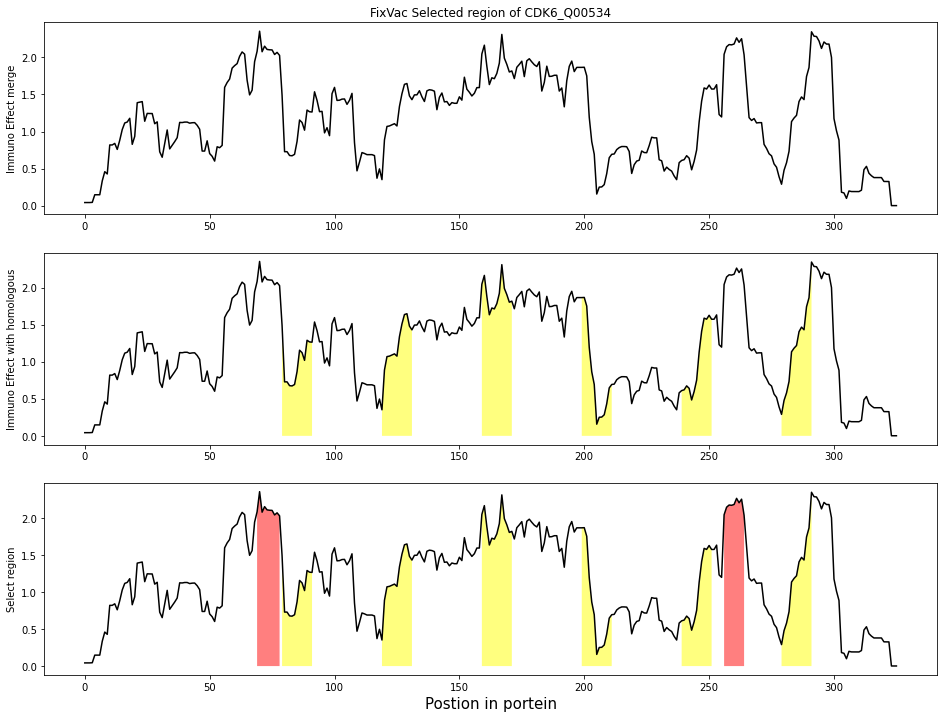

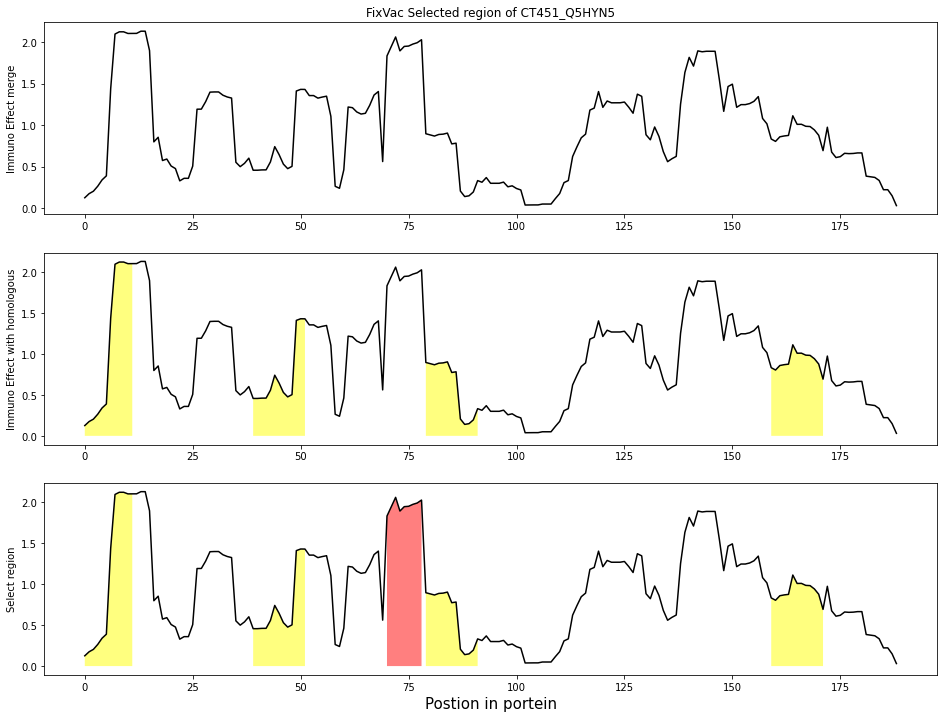

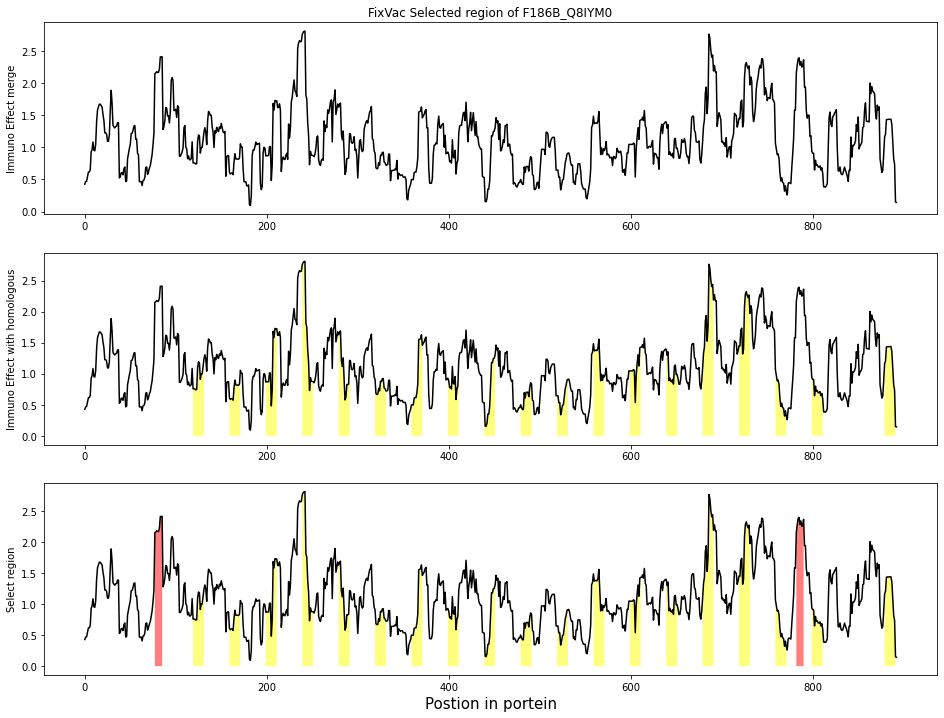

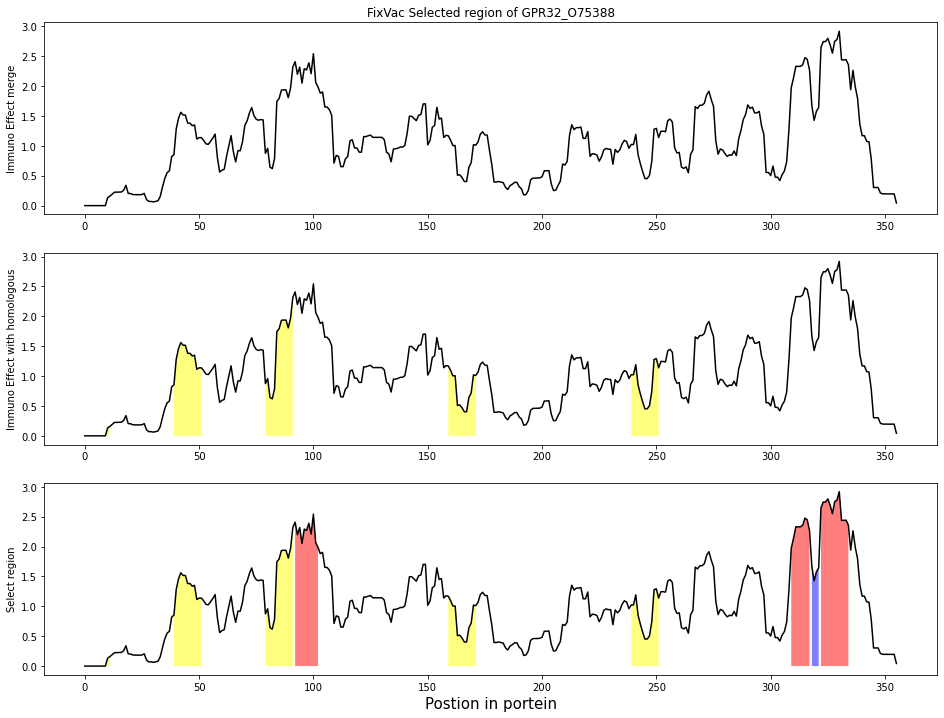

...

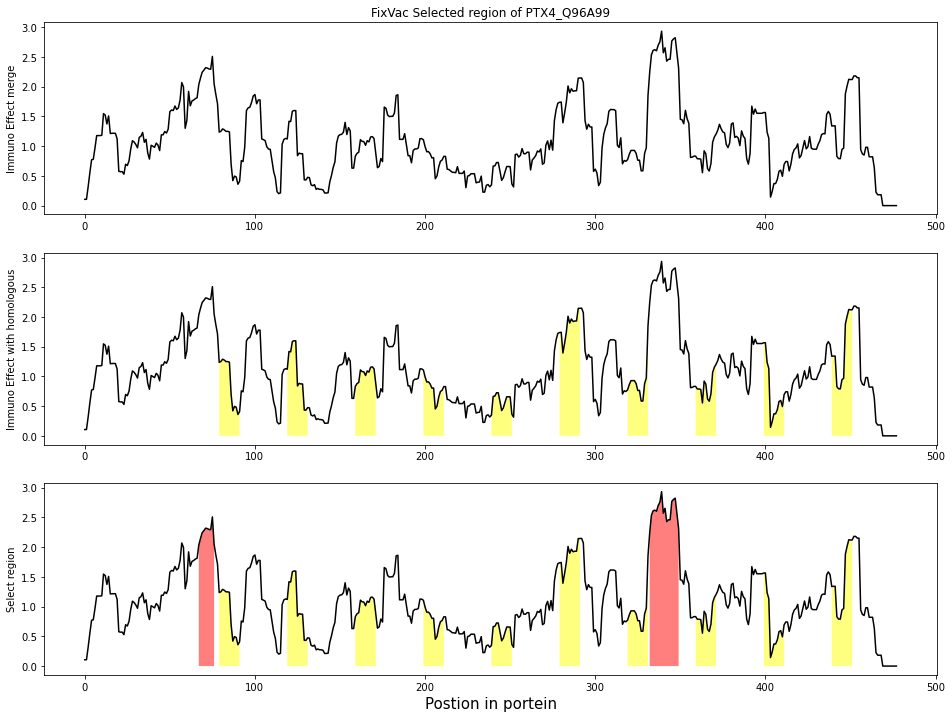

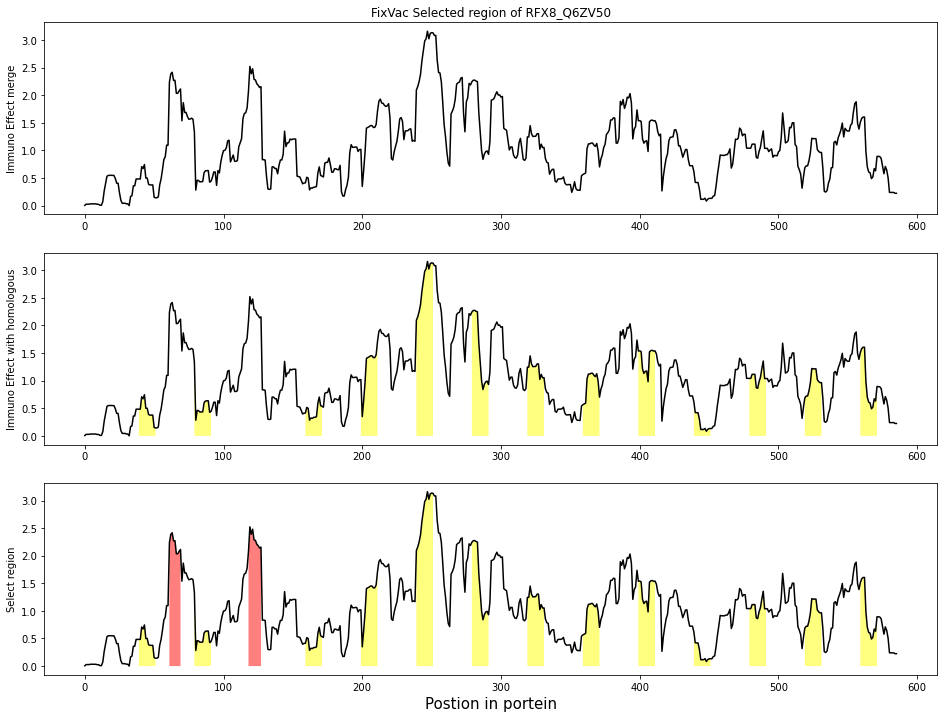

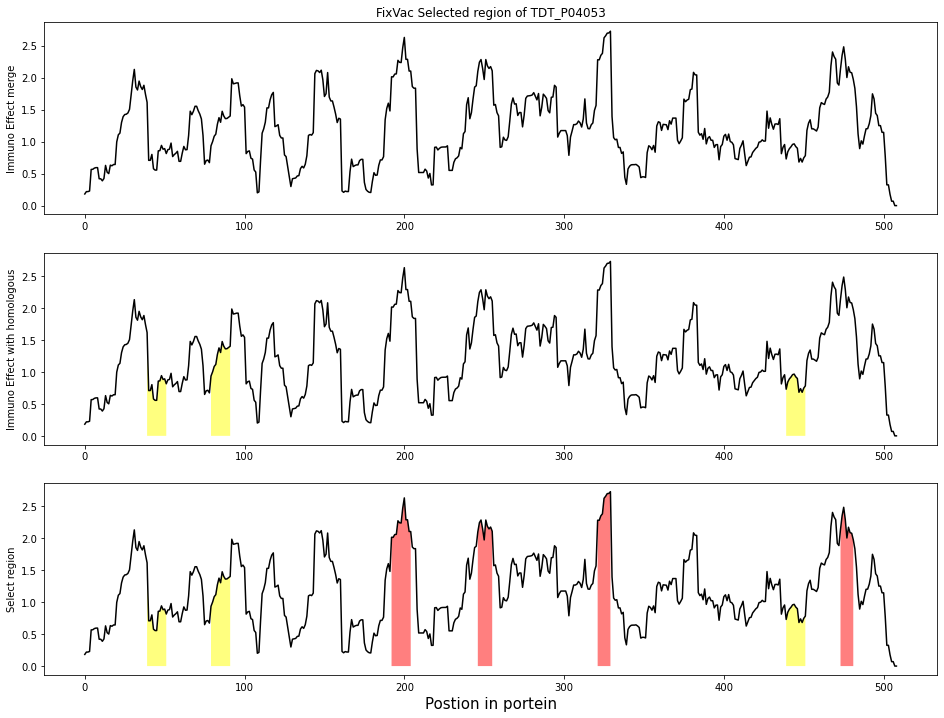

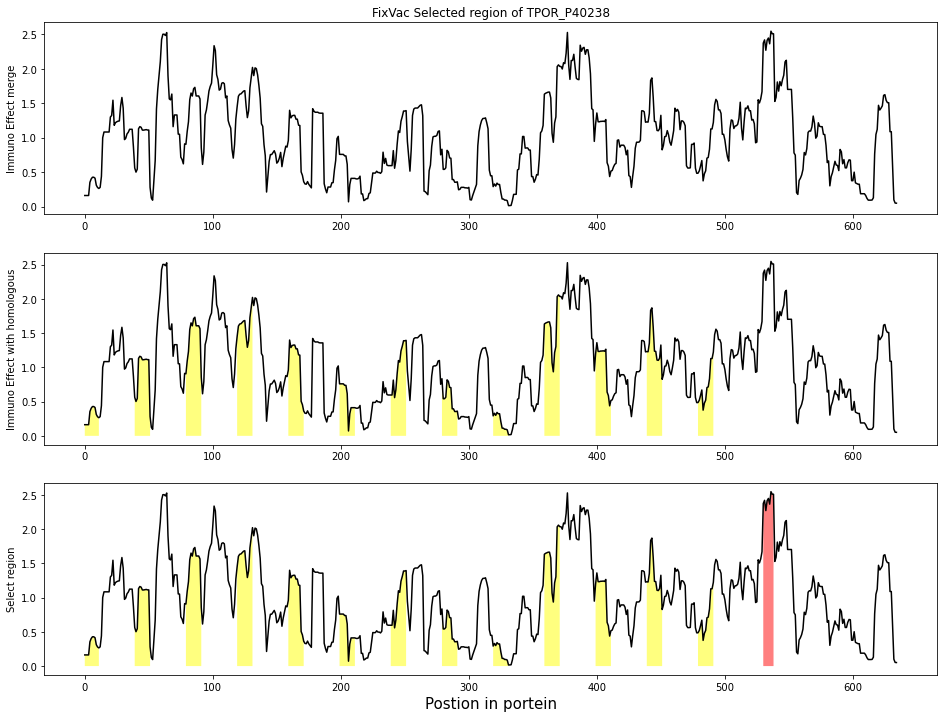

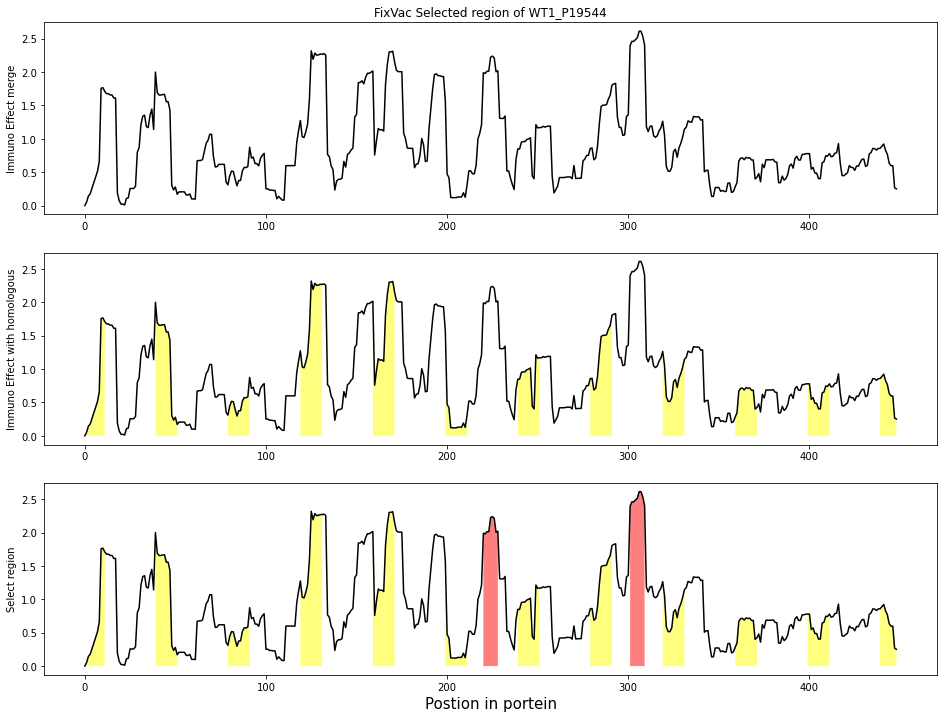

In [128]:
for TAA in Immuno_eff_all_allele_dict_withhomo:
    fig,(ax_merge,ax_withhomo,ax_selectregion) = plt.subplots(3,1,figsize=(16,12))
    for key in Immuno_eff_all_allele_dict_withhomo[TAA]:
        if key != "selectregionnum":
            pro_len = len(Immuno_eff_all_allele_dict_withhomo[TAA]["seq"])
            x = list(range(pro_len))
            y = np.asarray(Immuno_eff_all_allele_dict_withhomo[TAA][key])
            if key=="allele_merge":
                #print([float(format(i, '.4f')) for i in Immuno_eff_all_allele_dict_withhomo[TAA][key]])
                y2 = y
                ax_merge.plot(x,y,color="black")
                #ax_merge.set_ylim(0.0,5.0)
                ax_merge.set_ylabel("Immuno Effect merge",size=10)
                ax_merge.title.set_text("FixVac Selected region of {}".format(TAA))
                ax_withhomo.plot(x,y,color="black")
                ax_selectregion.plot(x,y, color="black")
            elif key=="withhomo":
                ax_withhomo.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_selectregion.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_withhomo.set_ylabel("Immuno Effect with homologous",size=10)
            elif key=="selectregion":
                y1_a = np.asarray([immu_eff_merge_init for i in range(pro_len)])
                y1_b = np.asarray([0 for i in range(pro_len)])
                ax_selectregion.fill_between(x,0,y2, where = y==10,facecolor='red',alpha=0.5)
                ax_selectregion.fill_between(x,0,y2, where = y==100,facecolor='blue',alpha=0.5)
                ax_selectregion.set_xlabel("Postion in portein",size=15)
                ax_selectregion.set_ylabel("Select region",size=10)
                #ax_selectregion.legend()
    plt.show()
    #input("please enter your input")

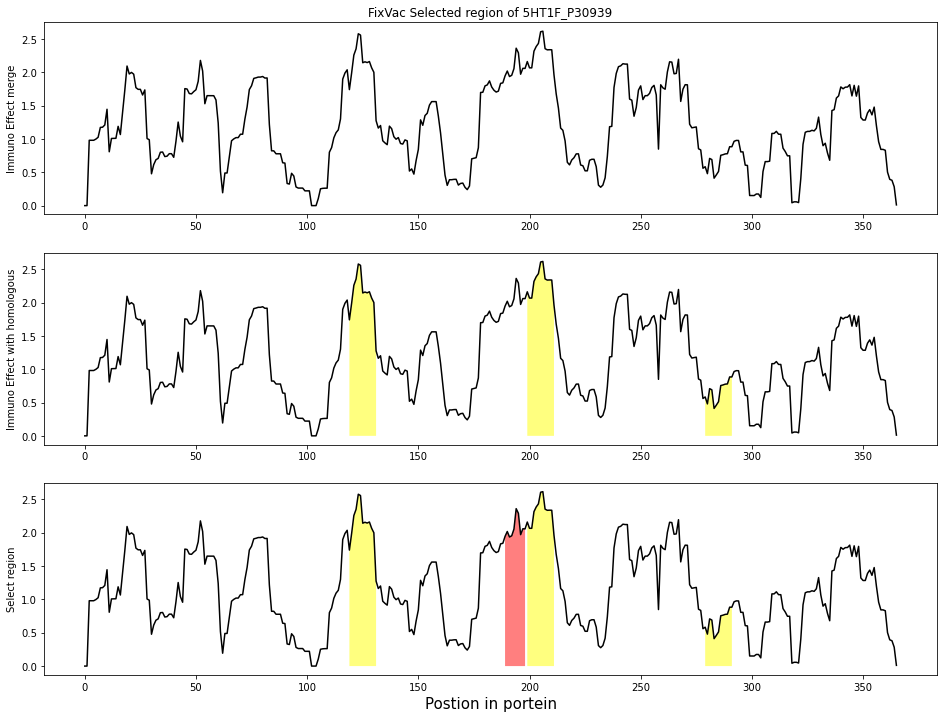

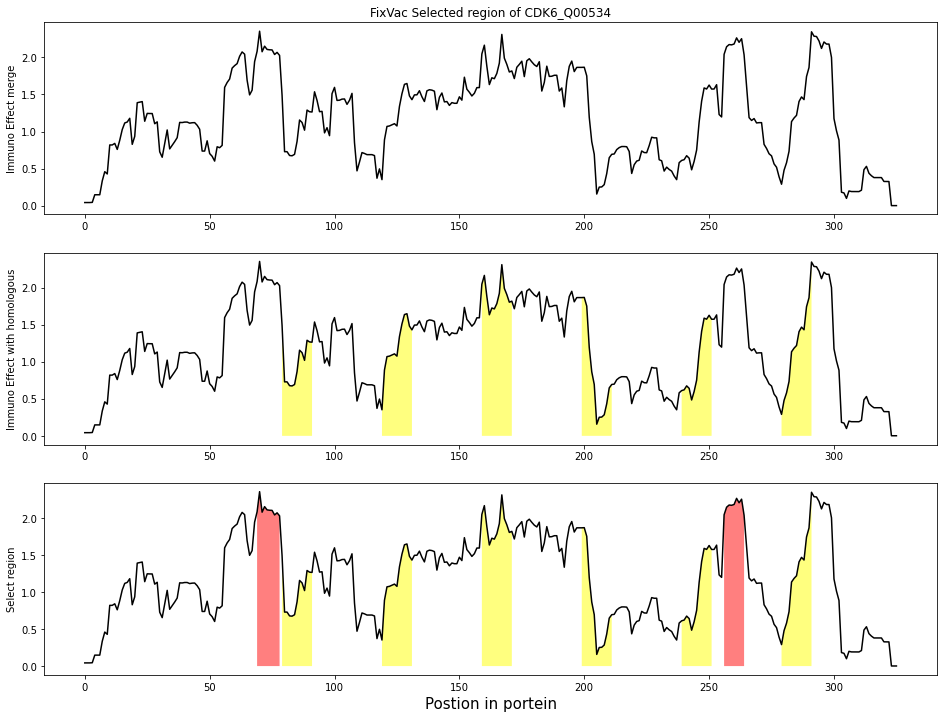

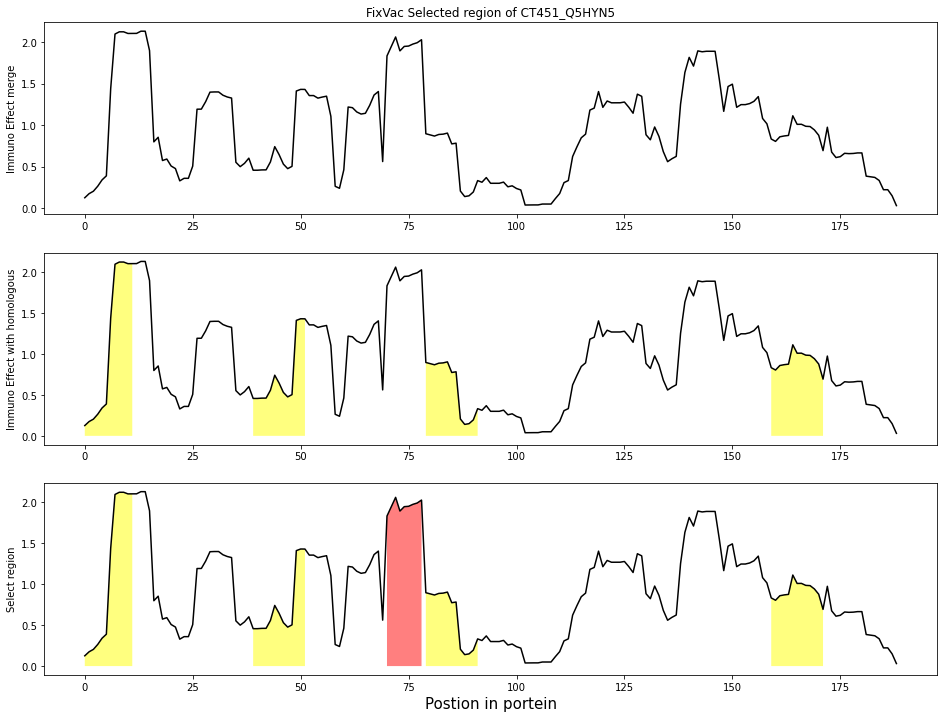

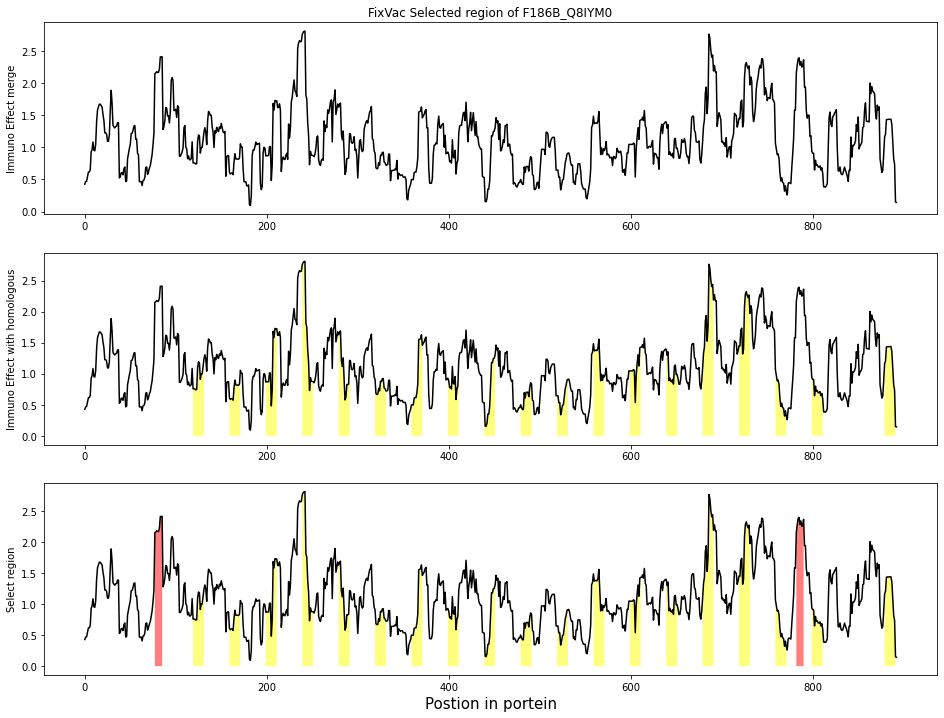

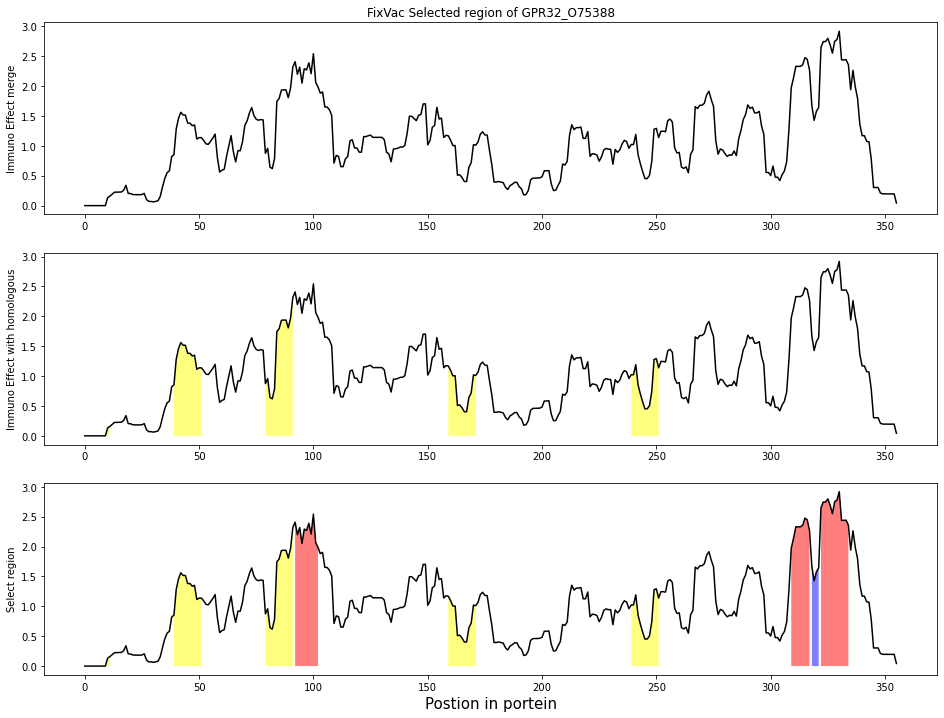

...

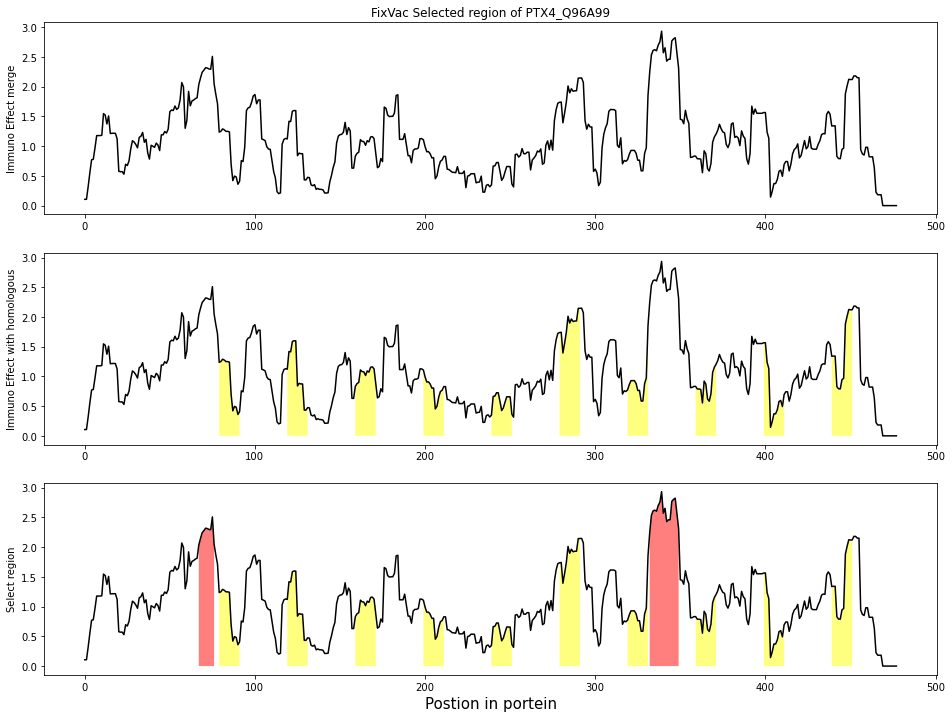

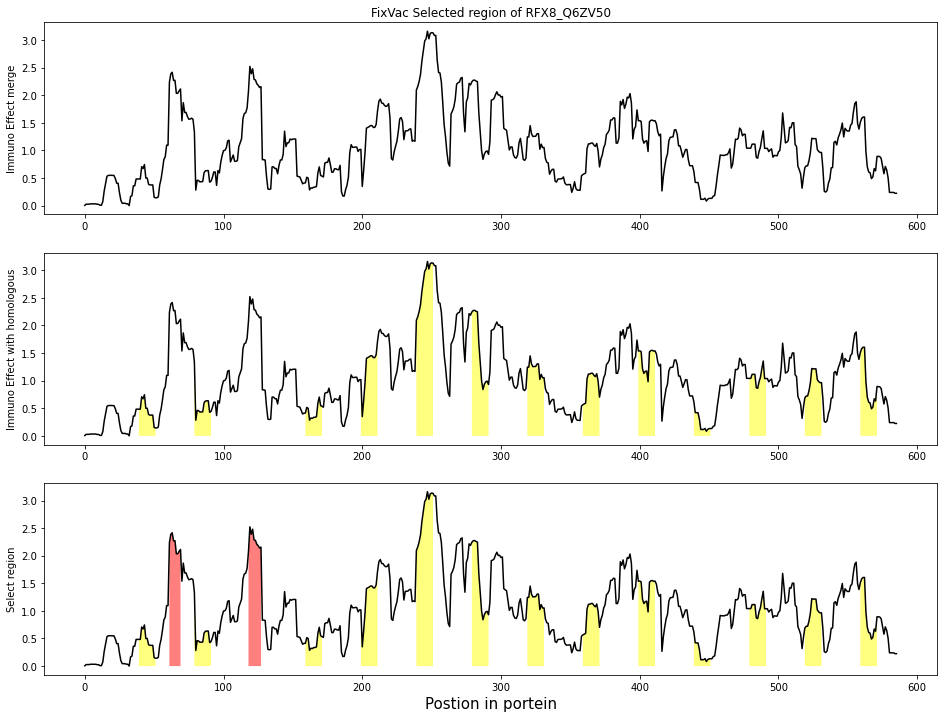

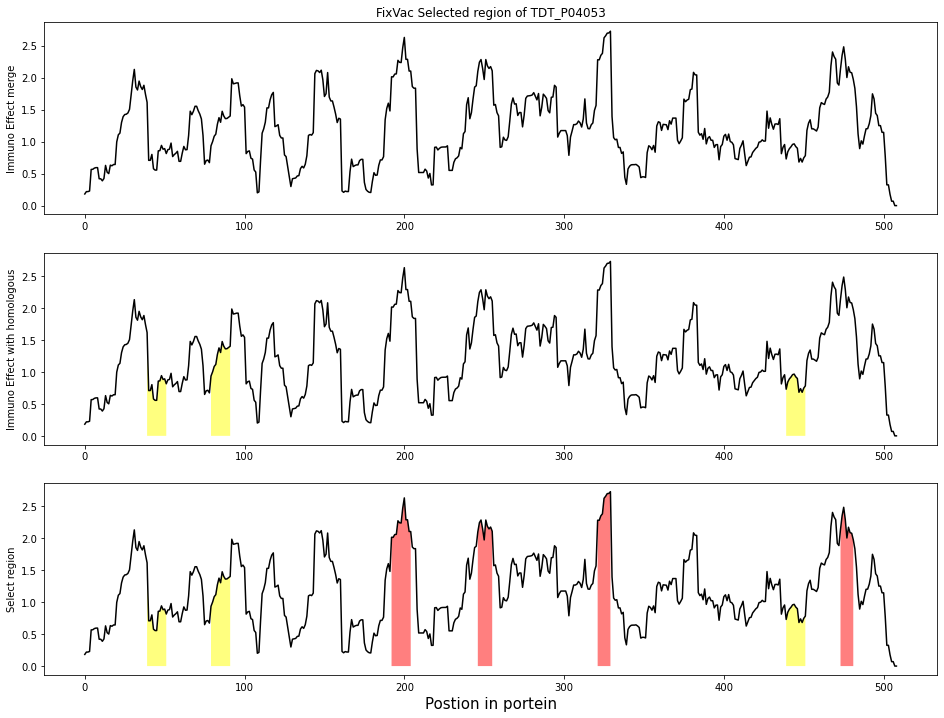

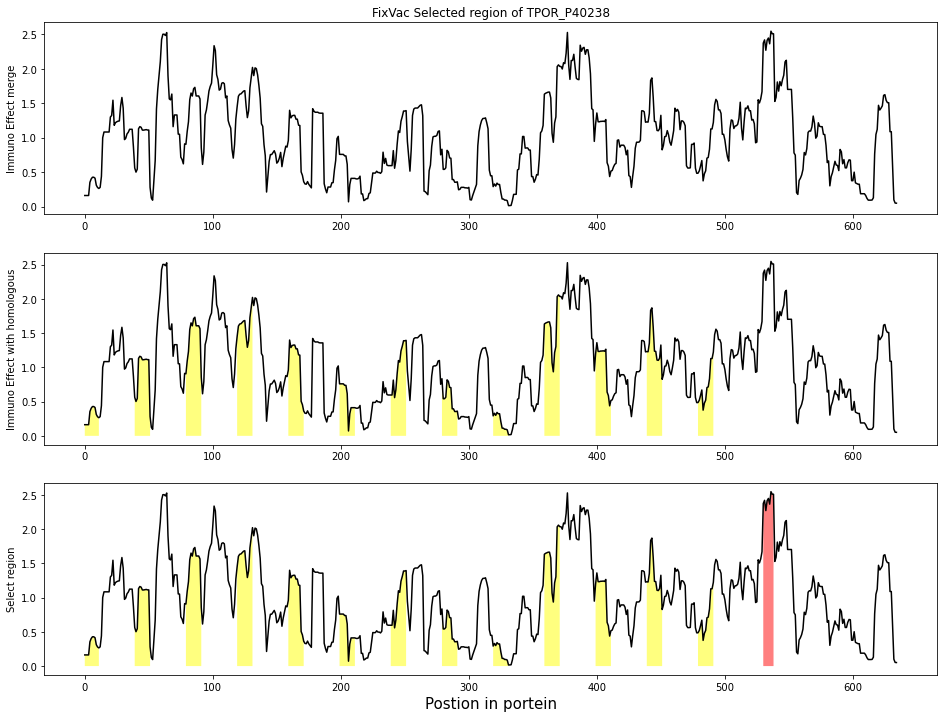

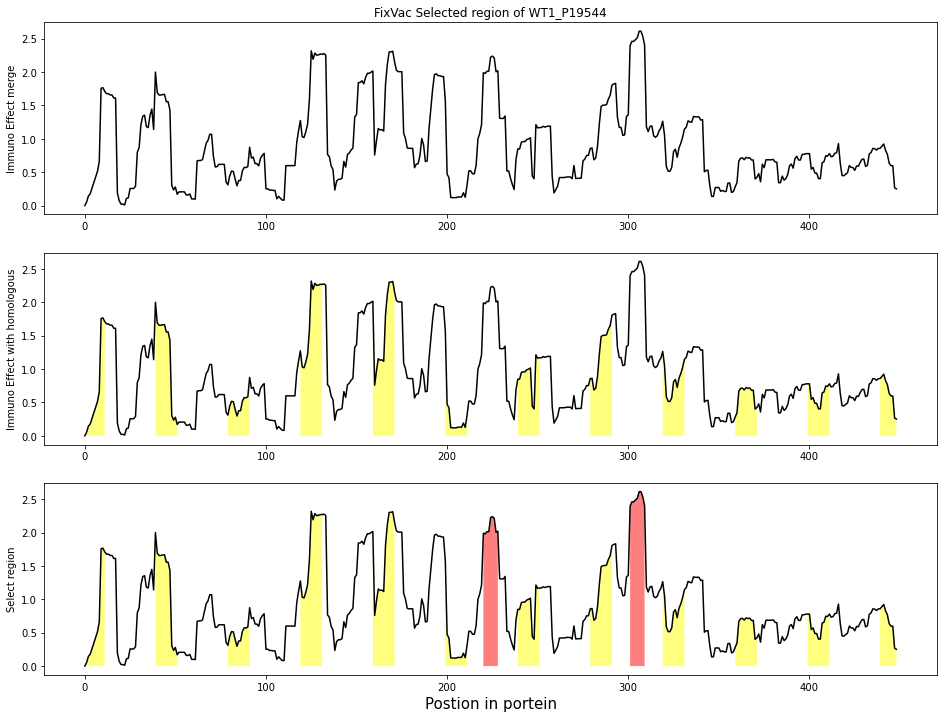

In [128]:
for TAA in Immuno_eff_all_allele_dict_withhomo:
    fig,(ax_merge,ax_withhomo,ax_selectregion) = plt.subplots(3,1,figsize=(16,12))
    for key in Immuno_eff_all_allele_dict_withhomo[TAA]:
        if key != "selectregionnum":
            pro_len = len(Immuno_eff_all_allele_dict_withhomo[TAA]["seq"])
            x = list(range(pro_len))
            y = np.asarray(Immuno_eff_all_allele_dict_withhomo[TAA][key])
            if key=="allele_merge":
                #print([float(format(i, '.4f')) for i in Immuno_eff_all_allele_dict_withhomo[TAA][key]])
                y2 = y
                ax_merge.plot(x,y,color="black")
                #ax_merge.set_ylim(0.0,5.0)
                ax_merge.set_ylabel("Immuno Effect merge",size=10)
                ax_merge.title.set_text("FixVac Selected region of {}".format(TAA))
                ax_withhomo.plot(x,y,color="black")
                ax_selectregion.plot(x,y, color="black")
            elif key=="withhomo":
                ax_withhomo.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_selectregion.fill_between(x, 0, y2, where = y < 0 , facecolor='yellow', alpha=0.5)
                ax_withhomo.set_ylabel("Immuno Effect with homologous",size=10)
            elif key=="selectregion":
                y1_a = np.asarray([immu_eff_merge_init for i in range(pro_len)])
                y1_b = np.asarray([0 for i in range(pro_len)])
                ax_selectregion.fill_between(x,0,y2, where = y==10,facecolor='red',alpha=0.5)
                ax_selectregion.fill_between(x,0,y2, where = y==100,facecolor='blue',alpha=0.5)
                ax_selectregion.set_xlabel("Postion in portein",size=15)
                ax_selectregion.set_ylabel("Select region",size=10)
                #ax_selectregion.legend()
    plt.show()
    #input("please enter your input")